In [152]:
import sympy as sy
from sympy.vector import CoordSys3D
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
N = CoordSys3D('N')
i=N.i
j=N.j
k=N.k

def norm(BC):
    return sy.sqrt(BC.dot(BC))
def unit(BC):
    return BC/norm(BC)
def projectNorm(v1,v2):
    #projeta v1 em v2
    return v1.dot(unit(v2))
def vector(a,b,c):
    return a*i+b*j+c*k
def subValues(exp,symbolVector,valuesVector):
    for i in range(len(symbolVector)):
        exp=exp.subs(symbolVector[i],valuesVector[i])
    return exp
def angle(v1,v2):
    cos=unit(v1).dot(unit(v2))
    ang=sy.acos(cos)
    return ang #RADIANS!
def solveForces(Forcas,aplicacao,icognitas,debugON=False):
    n=len(Forcas)
    vetorAplicacao=[]
    for f in range(n):
        vetorAplicacao.append(vector(*aplicacao[f]))

    #Somatorio das forcas
    dir=[i,j,k]
    somaF=[0,0,0]
    for f in range(n):
        for d in range(3):
            somaF[d]+=Forcas[f].dot(dir[d])
    #Somatorio dos momentos
    somaM=[0,0,0]
    for f in range(n):
        for d in range(3):
            somaM[d]+=(vetorAplicacao[f].cross(Forcas[f])).dot(dir[d])
    #Resolver equacoes
    equacoes=somaF+somaM
    equacoes = [i for i in equacoes if i != 0] #eliminar zeros
    result=sy.solve(equacoes,*icognitas)
    print(result)
    res=[]

    if(debugON):
        print('Forcas')
        print(Forcas)
        print('Equacoes')
        print(equacoes)
    for icog in range(len(icognitas)):
        res.append(result[icognitas[icog]])

        
    return res
    
def resposta(r,unidade):
    if(unidade==r'^{\circ}'):
        r=np.rad2deg(float(r))
    try:
        value=sy.symbols('{0:.3f}'.format(r)+unidade)
    except:
        #print("symbolic")
        value=r
    display(pd.DataFrame([cell_vars()]).round(2).transpose())
    print('A resposta final é:')
    display(value)

def cell_vars(offset=0):
    import io
    from contextlib import redirect_stdout

    ipy = get_ipython()
    out = io.StringIO()

    with redirect_stdout(out):
        ipy.magic("history {0}".format(ipy.execution_count - offset))

    #process each line...
    x = out.getvalue().replace(" ", "").split("\n")
    x = [a.split("=")[0] for a in x if "=" in a] #all of the variables in the cell
    g = globals()
    result = {k:g[k] for k in x if k in g}
    return result


from IPython.display import Image
from IPython.display import display, Math, Latex
from IPython.core.magic import register_cell_magic


@register_cell_magic
def write_and_run(line, cell):
    argz = line.split()
    file = argz[-1]
    mode = 'w'
    if len(argz) == 2 and argz[0] == '-a':
        mode = 'a'
    with open(file, mode) as f:
        f.write(cell)
    get_ipython().run_cell(cell)

<IPython.core.display.Math object>

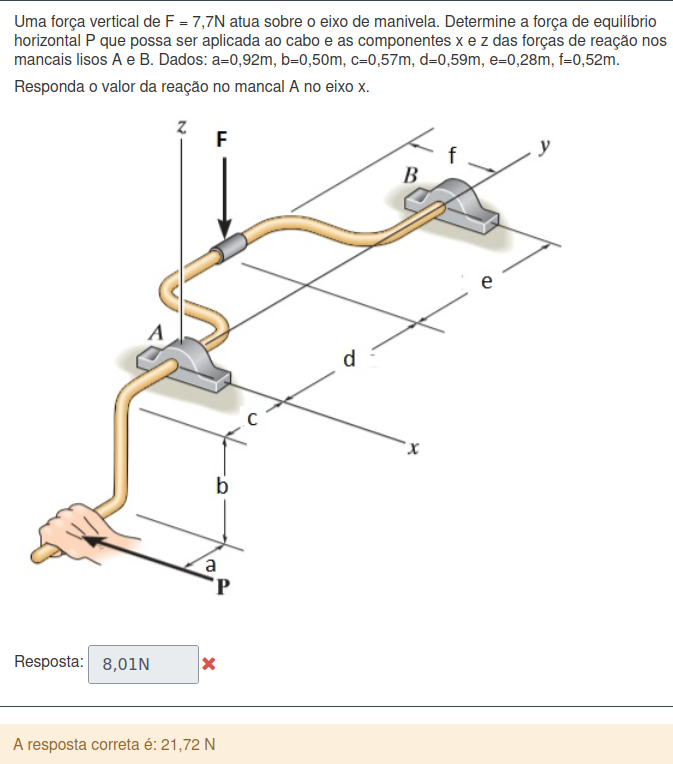

In [153]:
questao='1.1'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [154]:
%%write_and_run inputs/{questao}.py
modF=7.7
a=0.92
b=0.50
c=0.57
d=0.59
e=0.28
f=0.52

In [155]:
%%write_and_run resolutions/{questao}.py
modP=modF*f/b
modRAx=modP*(d+e+a+c)/(d+e)
resposta(modRAx,'N')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
modP,8.01
modRAx,21.72


A resposta final é:


21.723N

<IPython.core.display.Math object>

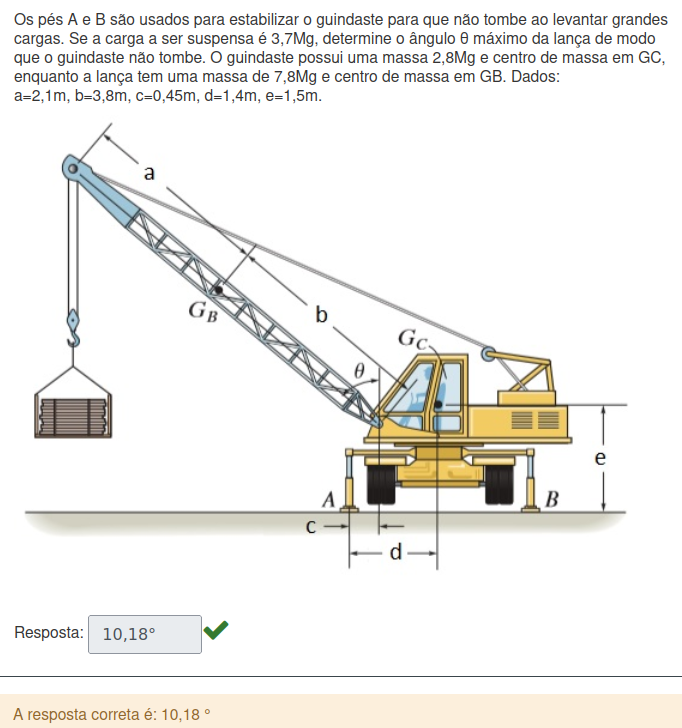

In [156]:
questao='1.2'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [157]:
%%write_and_run inputs/{questao}.py
mc=3.7
mg=2.8
ml=7.8
a=2.1
b=3.8
c=0.45
d=1.4
e=1.5 

In [158]:
%%write_and_run resolutions/{questao}.py
theta=sy.asin((mg*d+c*(mc+ml))/((a+b)*mc+b*ml))
resposta(theta,r'^{\circ}')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.177637633482023


A resposta final é:


10.178^{\circ}

<IPython.core.display.Math object>

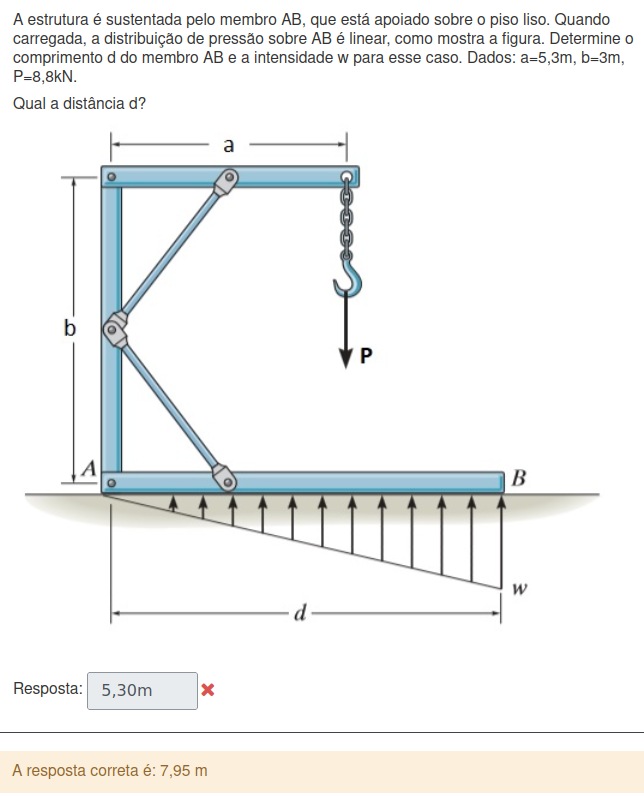

In [159]:
questao='1.3'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [160]:
%%write_and_run inputs/{questao}.py
a=5.3

In [161]:
%%write_and_run resolutions/{questao}.py
d=a*3/2
resposta(d,'m')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
d,7.95


A resposta final é:


7.950m

<IPython.core.display.Math object>

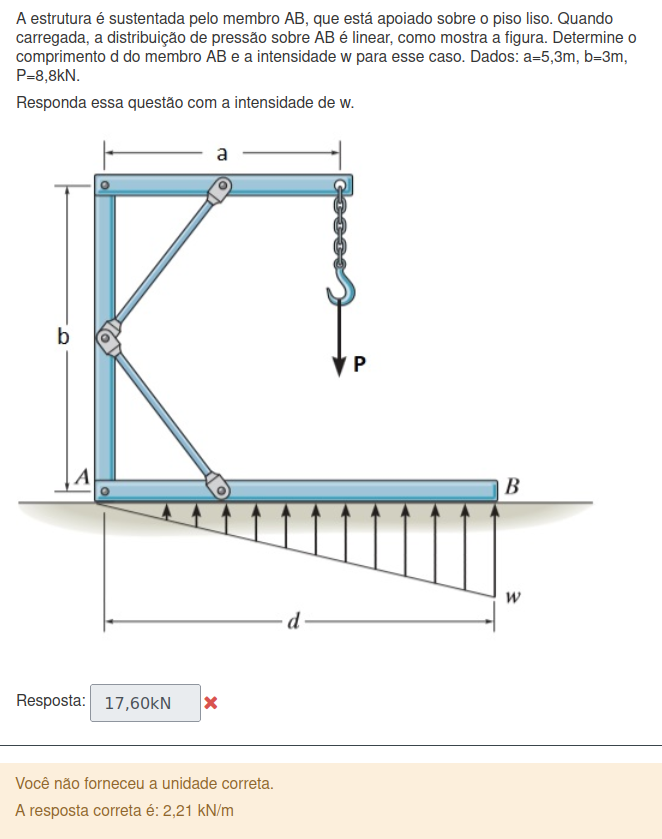

In [162]:
questao='1.4'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [163]:
%%write_and_run inputs/{questao}.py
a=5.3
modP=8.8

In [164]:
%%write_and_run resolutions/{questao}.py
w=(4/3)*modP/a
resposta(w,'kN/m')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
w,2.21


A resposta final é:


2.214kN/m

<IPython.core.display.Math object>

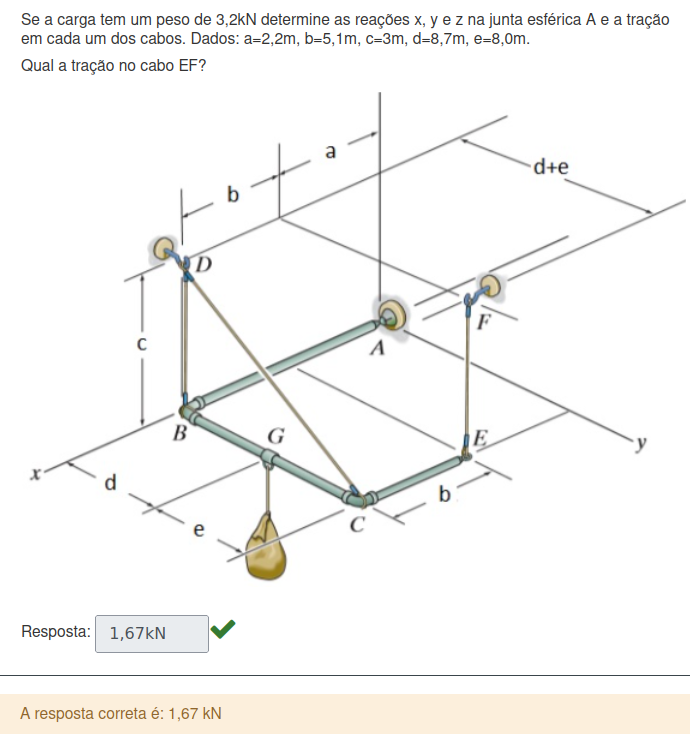

In [165]:
questao='1.5'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [166]:
%%write_and_run inputs/{questao}.py
a=2.2
b=5.1
c=3
d=8.7
e=8
P=3.2

In [167]:
%%write_and_run resolutions/{questao}.py
modTef=(d*P/(d+e))
resposta(modTef,'kN')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
modTef,1.67


A resposta final é:


1.667kN

<IPython.core.display.Math object>

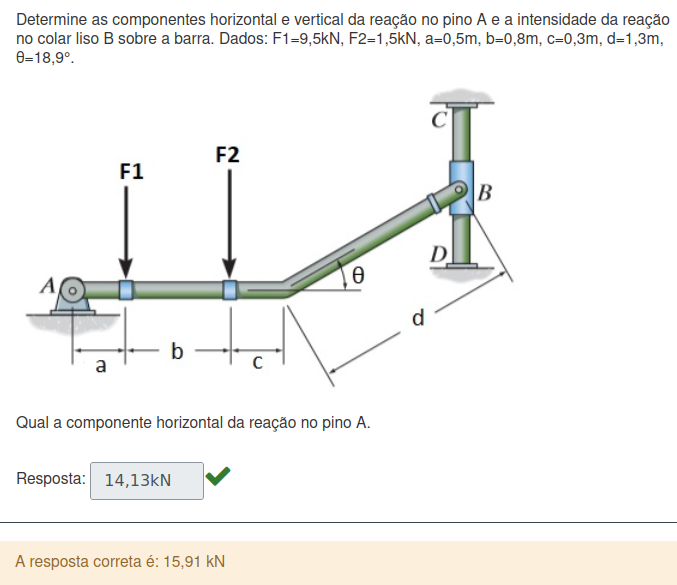

In [168]:
questao='1.6'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [169]:
%%write_and_run inputs/{questao}.py
a=0.5
b=0.8
c=0.3
d=1.3
thetad=18.9
F1=9.5
F2=1.5

In [170]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
Ra=(F1*a+F2*(a+b))/(d*sy.sin(theta))
resposta(Ra,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.33
Ra,15.9109879997049


A resposta final é:


15.911kN

<IPython.core.display.Math object>

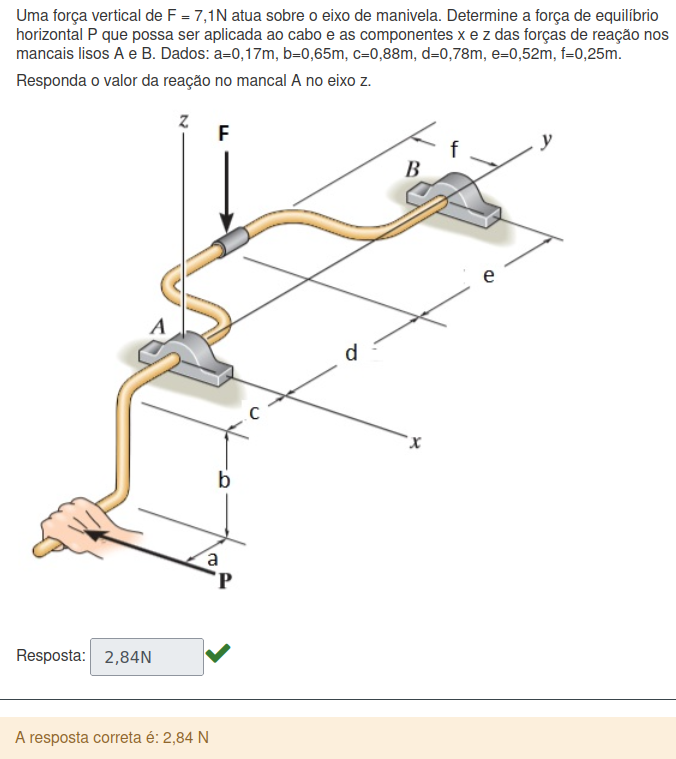

In [171]:
questao='1.7'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [172]:
%%write_and_run inputs/{questao}.py
F=7.1
d=0.78
e=0.52

In [173]:
%%write_and_run resolutions/{questao}.py
Ra=F*(1-d/(d+e))
resposta(Ra,'N')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
Ra,2.84


A resposta final é:


2.840N

<IPython.core.display.Math object>

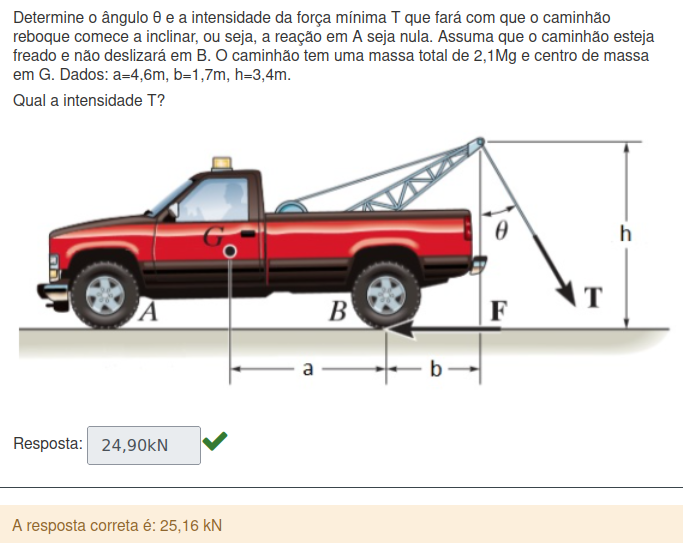

In [174]:
questao='1.8'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [175]:
%%write_and_run inputs/{questao}.py
a=4.6
b=1.7
h=3.4
m=2.1

In [176]:
%%write_and_run resolutions/{questao}.py
P=m*9.81
theta=sy.atan(h/b)
T=P*a/(sy.cos(theta)*b+sy.sin(theta)*h)
resposta(T,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
P,20.6
theta,1.10714871779409
T,24.9294220541855


A resposta final é:


24.929kN

<IPython.core.display.Math object>

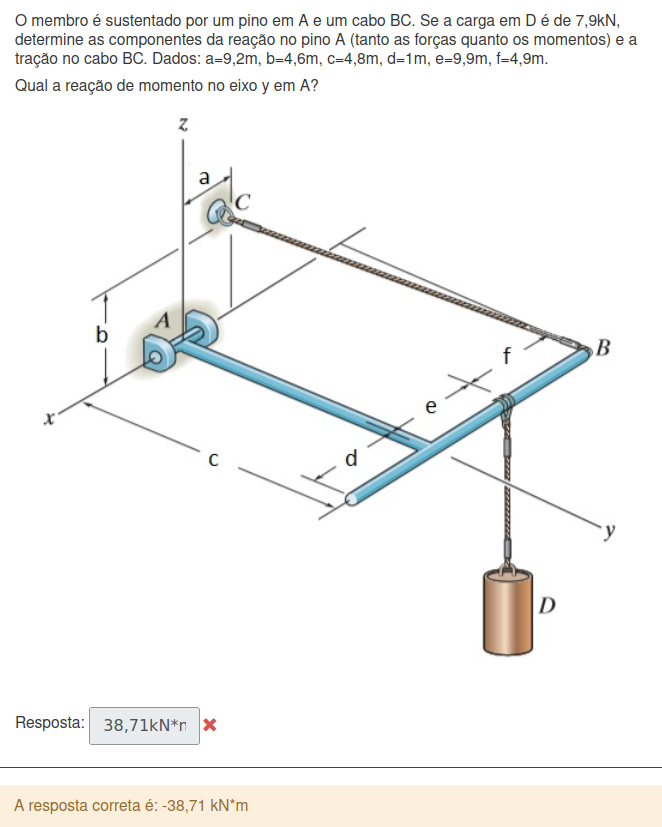

In [177]:
questao='1.9'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [178]:
%%write_and_run inputs/{questao}.py
a=9.2
b=4.6
c=4.8
d=1
e=9.9
f=4.9
P=7.9

In [179]:
%%write_and_run resolutions/{questao}.py
DX=a-(f+e)
DY=c
DZ=b
H=sy.sqrt(DX**2+DY**2+DZ**2)
modT=P*H/DZ
modMAy=-P*f
resposta(modMAy,'kN*m')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
DX,-5.6
DY,4.8
DZ,4.6
H,8.69252552484029
modT,14.9284677491822
modMAy,-38.71


A resposta final é:


-38.710kN*m

<IPython.core.display.Math object>

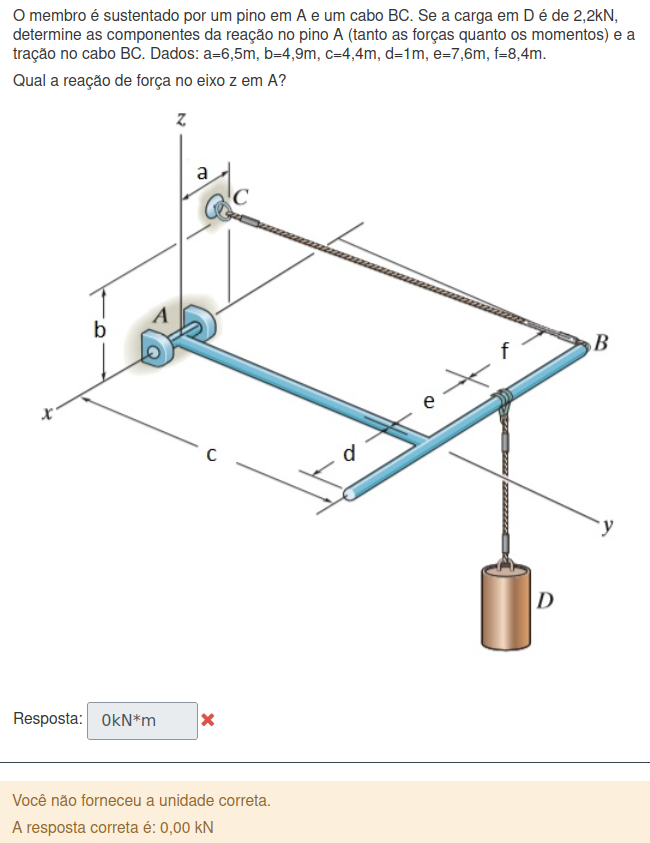

In [180]:
questao='1.10'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [181]:
%%write_and_run inputs/{questao}.py
noInputNeeded=0


In [182]:
%%write_and_run resolutions/{questao}.py
resposta(0,'kN')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0


A resposta final é:


0.000kN

<IPython.core.display.Math object>

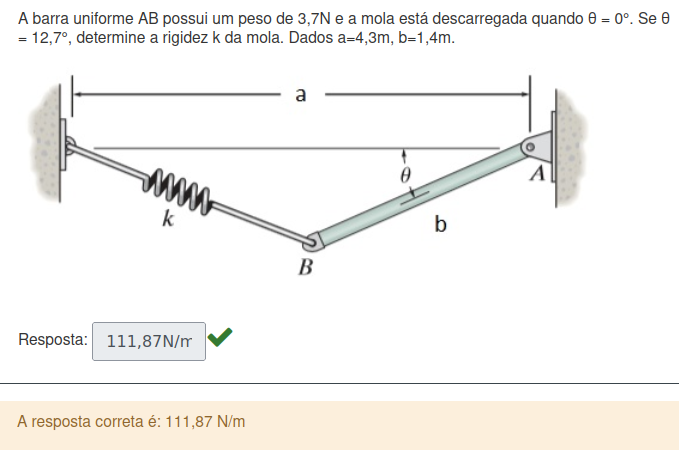

In [183]:
questao='2.1'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [184]:
%%write_and_run inputs/{questao}.py
P=3.7
thetad=12.7
a=4.3
b=1.4

In [185]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
L0=a-b
Lf=sy.sqrt((a-b*sy.cos(theta))**2+(b*sy.sin(theta))**2)
T=Lf*P/(2*a*sy.tan(theta))
kcte=T/(Lf-L0)
resposta(kcte,'N/m')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.22
L0,2.9
Lf,2.95034982517190
T,5.63249048891981
kcte,111.867131011663


A resposta final é:


111.867N/m

<IPython.core.display.Math object>

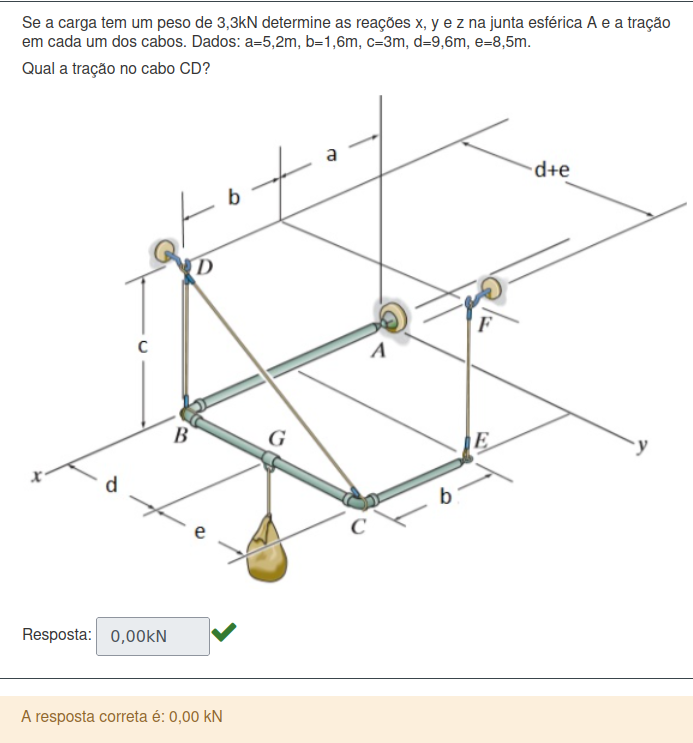

In [186]:
questao='2.2'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [187]:
%%write_and_run inputs/{questao}.py
a=5.2
b=1.6
c=3
d=9.6
e=8.5
P=3.3

In [188]:
%%write_and_run resolutions/{questao}.py
resposta(0,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0


A resposta final é:


0.000kN

<IPython.core.display.Math object>

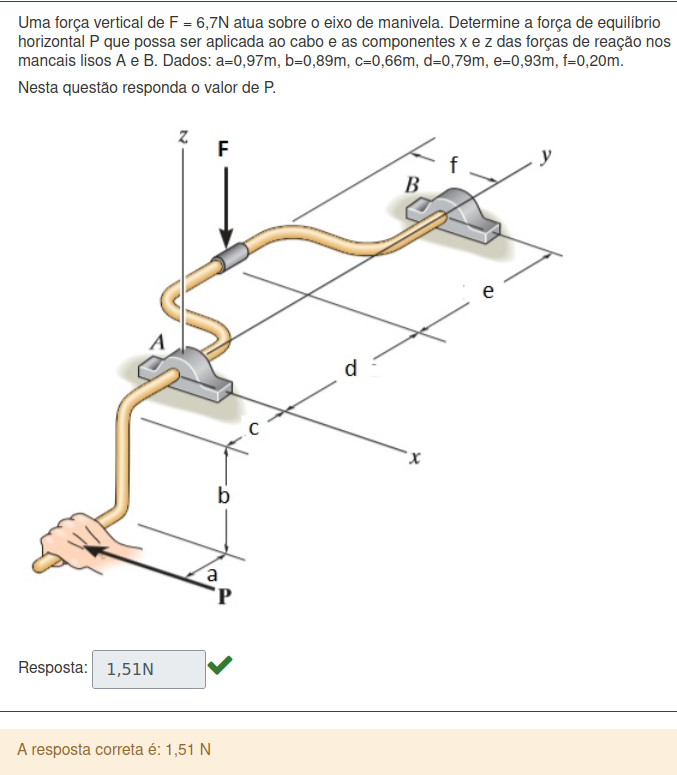

In [189]:
questao='2.3'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [190]:
%%write_and_run inputs/{questao}.py
modF=6.7
f=0.2
b=0.89

In [191]:
%%write_and_run resolutions/{questao}.py
modP=modF*f/b
resposta(modP,'N')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
modP,1.51


A resposta final é:


1.506N

<IPython.core.display.Math object>

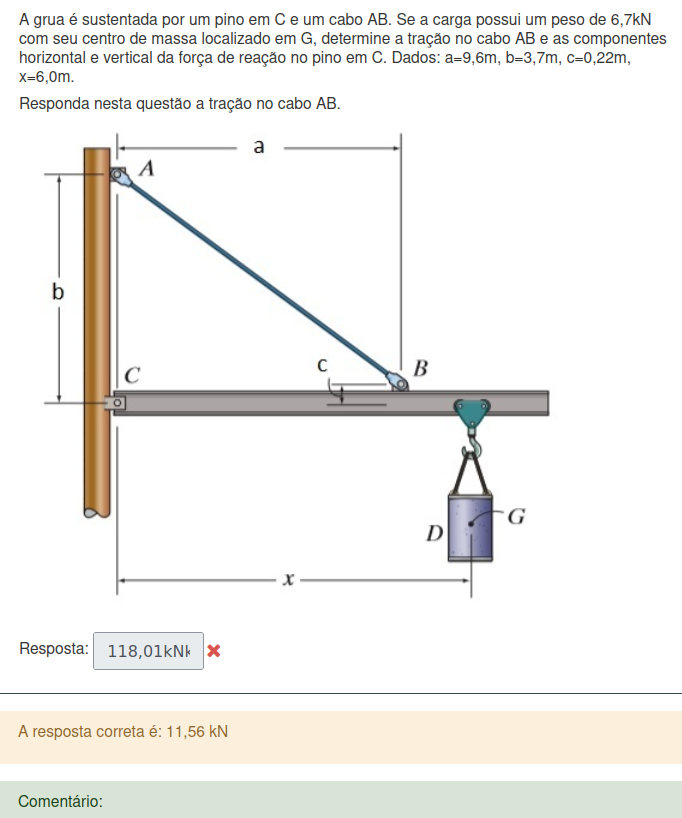

In [192]:
questao='2.4'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [193]:
%%write_and_run inputs/{questao}.py
a=9.6
b=3.7
c=0.22
x=6
P=6.7

In [194]:
%%write_and_run resolutions/{questao}.py
H=sy.sqrt(a**2+(b-c)**2)
T=P*x*H/(b*a)
resposta(T,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
H,10.2112878717623
T,11.5566940440553


A resposta final é:


11.557kN

<IPython.core.display.Math object>

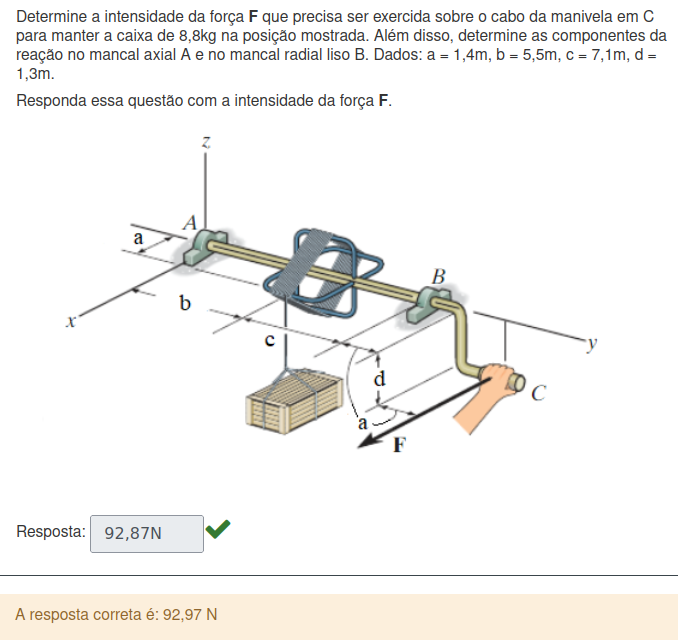

In [195]:
questao='2.5'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [196]:
%%write_and_run inputs/{questao}.py
m=8.8
g=9.8
a=1.4
b=5.5
c=7.1
d=1.3

In [197]:
%%write_and_run resolutions/{questao}.py
P=m*g
F=m*g*a/d
resposta(F,'N')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
P,86.24
F,92.87


A resposta final é:


92.874N

<IPython.core.display.Math object>

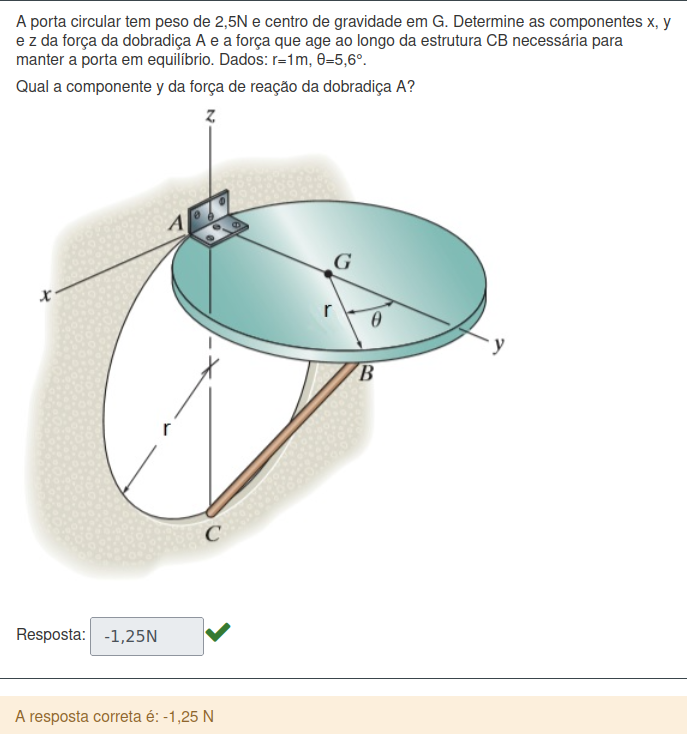

In [198]:
questao='2.6'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [199]:
%%write_and_run inputs/{questao}.py
P=2.5
r=1
thetad=5.6

In [200]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
Ry=-P/(1+sy.cos(theta))
resposta(Ry,'N')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.1
Ry,-1.25299001007242


A resposta final é:


-1.253N

<IPython.core.display.Math object>

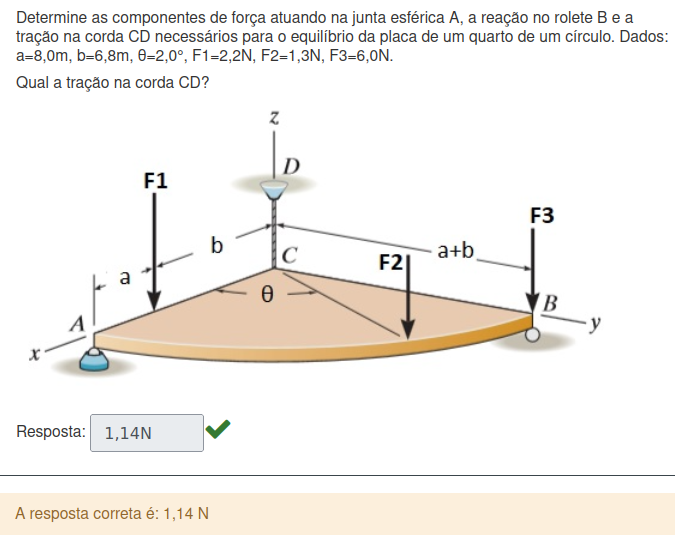

In [201]:
questao='2.7'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [202]:
%%write_and_run inputs/{questao}.py
a=8
b=6.8
thetad=2
F1=2.2
F2=1.3
F3=6

In [203]:
%%write_and_run resolutions/{questao}.py
r=a+b
theta=np.deg2rad(thetad)
RBz=F2*sy.sin(theta)+F3
RAz=(F1*b+F2*r*sy.cos(theta))/r
T=F1+F2+F3-RAz-RBz
resposta(T,'N')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
r,14.8
theta,0.03
RBz,6.04536934571325
RAz,2.31001888593564
T,1.14461176835111


A resposta final é:


1.145N

<IPython.core.display.Math object>

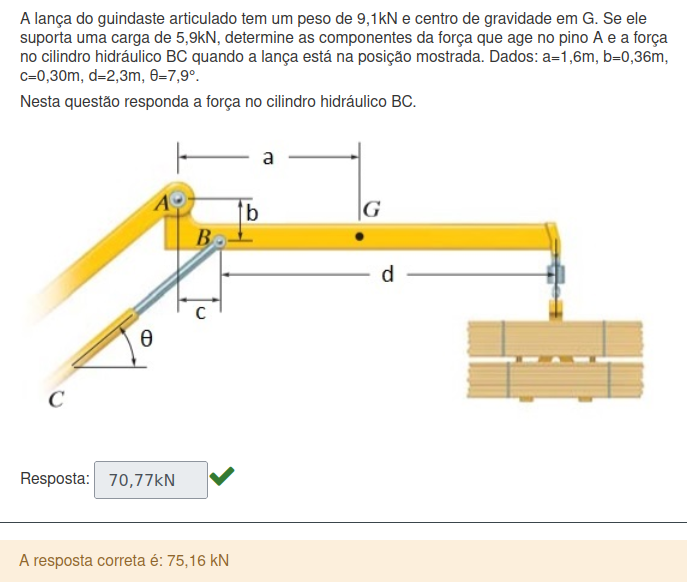

In [204]:
questao='2.8'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [205]:
%%write_and_run inputs/{questao}.py
modPL=9.1
modPC=5.9
a=1.6
b=0.36
c=0.3
d=2.3
thetad=7.9

In [206]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
RAy=(-modPL*(a-c)-modPC*d+b/sy.tan(theta)*(modPL+modPC))/(c+b/sy.tan(theta))
RAx=(RAy-modPL-modPC)/sy.tan(theta)
modT=-RAx/sy.cos(theta)
resposta(modT,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.14
RAy,4.66963629876454
RAx,-74.4469191378593
modT,75.1602300643018


A resposta final é:


75.160kN

<IPython.core.display.Math object>

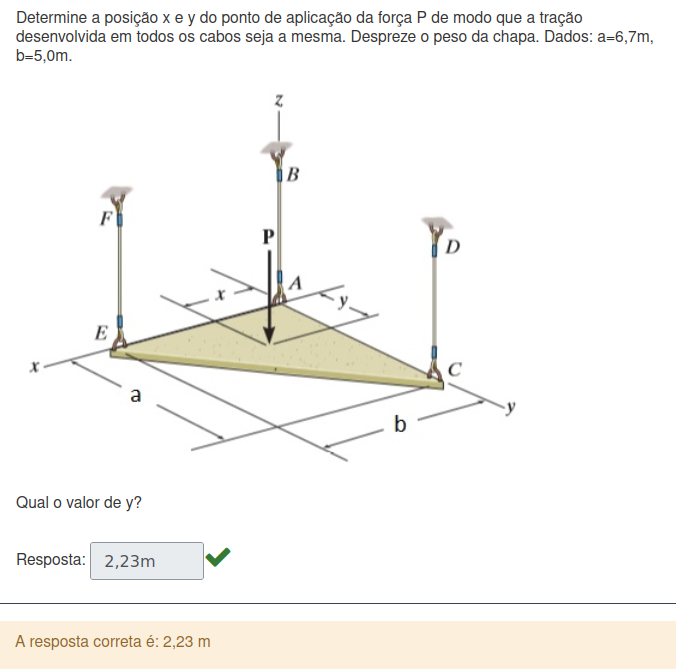

In [207]:
questao='2.9'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [208]:
%%write_and_run inputs/{questao}.py
a=6.7
b=5

In [209]:
%%write_and_run resolutions/{questao}.py
y=a/3
x=b/3;
resposta(y,'m')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
y,2.23
x,1.67


A resposta final é:


2.233m

<IPython.core.display.Math object>

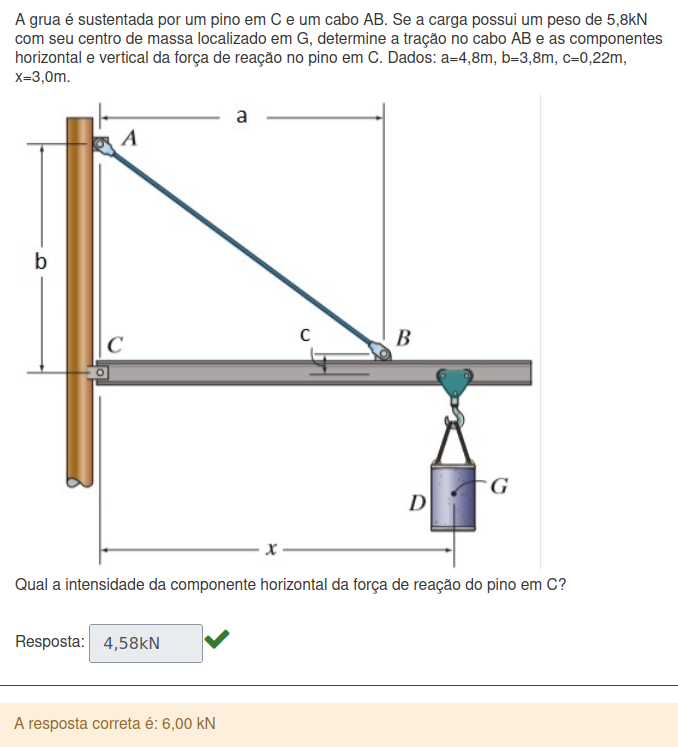

In [210]:
questao='2.10'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [211]:
%%write_and_run inputs/{questao}.py
a=4.8
b=3.8
c=0.22
x=3
P=5.8

In [212]:
%%write_and_run resolutions/{questao}.py
H=(a**2+(b-c)**2)**0.5
T=P*x*H/(b*a)
RCx=T*a/H
RCy=P*(1-x*(b-c)/(b*a))
resposta(RCx,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
H,5.99
T,5.71
RCx,4.58
RCy,2.38


A resposta final é:


4.579kN

<IPython.core.display.Math object>

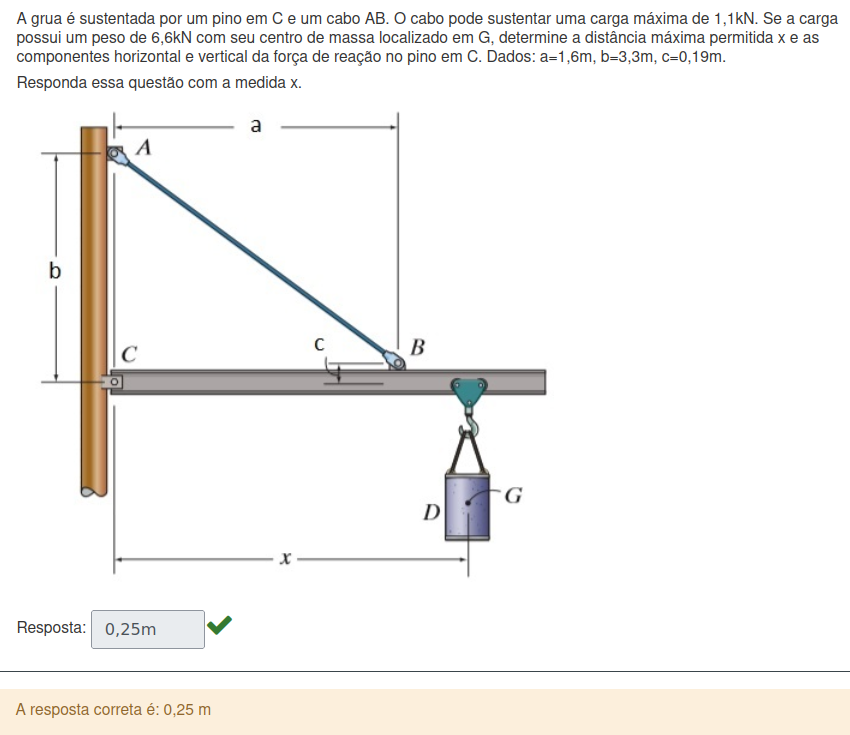

In [213]:
questao='3.1'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [214]:
%%write_and_run inputs/{questao}.py
P=6.6
T=1.1
a=1.6
b=3.3
c=0.19

In [215]:
%%write_and_run resolutions/{questao}.py
H=(a**2+(b-c)**2)**0.5
RCx,RCy,x = sy.symbols('RCx RCy x')
aplicacao=[[a,c,0],[x,0,0],[0,0,0],[0,0,0]]
vT=T*vector(-a/H,(b-c)/H,0)
vP=P*vector(0,-1,0)
vRCx=RCx*vector(1,0,0)
vRCy=RCy*vector(0,1,0)
Forcas=[vT,vP,vRCx,vRCy]
icognitas=[x,RCx,RCy]
x=solveForces(Forcas,aplicacao,icognitas)[0]
resposta(x,'m')

{RCx: 0.503224939567437, RCy: 5.62185652371579, x: 0.251612469783718}


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
H,3.5
aplicacao,"[[1.6, 0.19, 0], [x, 0, 0], [0, 0, 0], [0, 0, 0]]"
vT,(-0.503224939567437)*N.i + 0.978143476284205*N.j
vP,(-6.6)*N.j
vRCx,RCx*N.i
vRCy,RCy*N.j
Forcas,[(-0.503224939567437)*N.i + 0.978143476284205*...
icognitas,"[x, RCx, RCy]"
x,0.251612469783718


A resposta final é:


0.252m

<IPython.core.display.Math object>

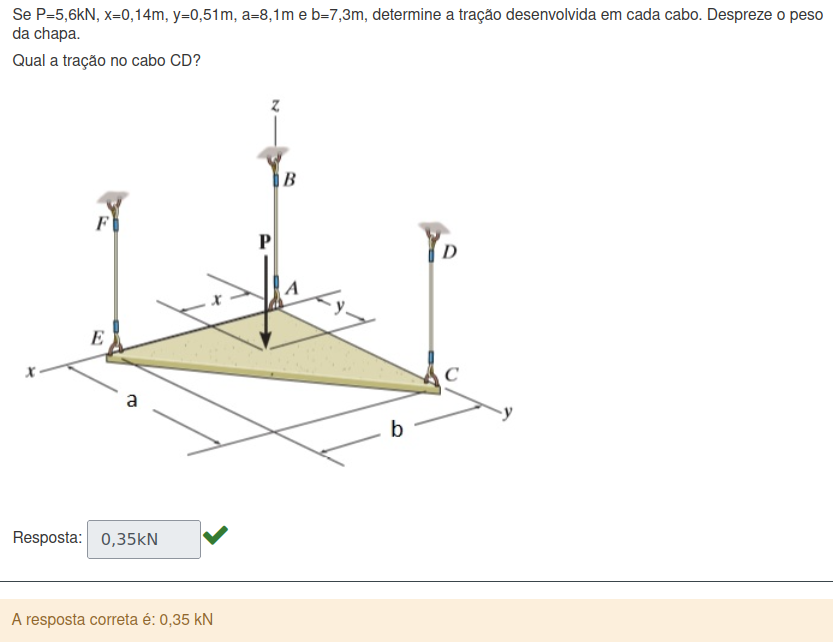

In [216]:
questao='3.2'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [217]:
%%write_and_run inputs/{questao}.py
P=5.6
x=0.14
y=0.51
a=8.1
b=7.3

In [218]:
%%write_and_run resolutions/{questao}.py
F,B,D = sy.symbols('F B D')
#a,b,theta, r, F1, F2, F3 = sy.symbols(r'a b \theta r F_1 F_2 F_3')
aplicacao=[
    [b,0,0],
    [0,0,0],
    [0,a,0],
    [x,y,0]]
vF  =F*vector(0,0,1)
vB  =B*vector(0,0,1)
vD  =D*vector(0,0,1)
vP  =P*vector(0,0,-1)

Forcas=[vF,vB,vD,vP]
icognitas=[F,B,D]
res=solveForces(Forcas,aplicacao,icognitas)[-1]
resposta(res,'kN')


{F: 0.107397260273973, B: 5.14001014713343, D: 0.352592592592593}


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
aplicacao,"[[7.3, 0, 0], [0, 0, 0], [0, 8.1, 0], [0.14, 0..."
vF,F*N.k
vB,B*N.k
vD,D*N.k
vP,(-5.6)*N.k
Forcas,"[F*N.k, B*N.k, D*N.k, (-5.6)*N.k]"
icognitas,"[F, B, D]"
res,0.352592592592593


A resposta final é:


0.353kN

<IPython.core.display.Math object>

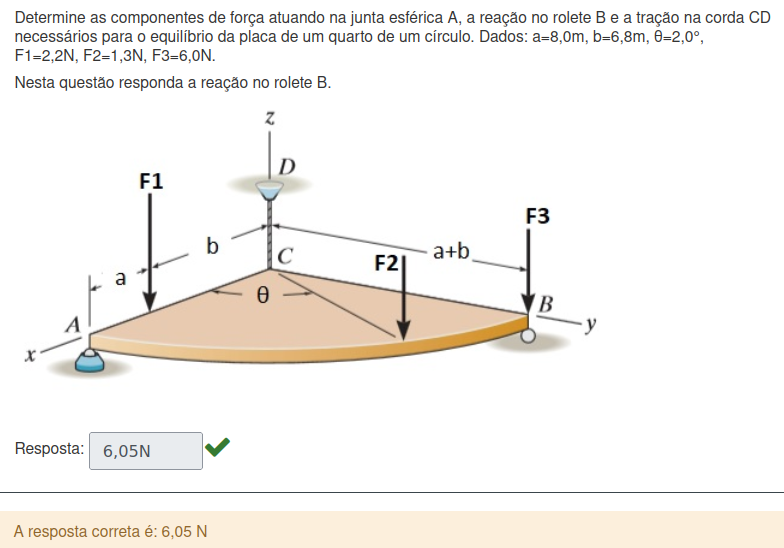

In [219]:
questao='3.3'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [220]:
%%write_and_run inputs/{questao}.py
a=8
b=6.8
thetad=2
F1=2.2
F2=1.3
F3=6

In [221]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
T,RA,RB = sy.symbols('T RA RB')
#a,b,theta, r, F1, F2, F3 = sy.symbols(r'a b \theta r F_1 F_2 F_3')
aplicacao=[
    [0,0,0],
    [b,0,0],
    [r*sy.cos(theta),r*sy.sin(theta),0],
    [0,r,0],
    [r,0,0],
    [0,r,0]]
vT   =T *vector(0,0,1)
vF1  =F1*vector(0,0,-1)
vF2  =F2*vector(0,0,-1)
vF3  =F3*vector(0,0,-1)
vRA  =RA*vector(0,0,1)
vRB  =RB*vector(0,0,1)

Forcas=[vT,vF1,vF2,vF3,vRA,vRB]
icognitas=[RA,RB,T]
RA,RB,T=solveForces(Forcas,aplicacao,icognitas)
resposta(RB,'N')


{RA: 2.31001888593563, RB: 6.04536934571325, T: 1.14461176835111}


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.03
aplicacao,"[[0, 0, 0], [6.8, 0, 0], [14.7909842398826, 0...."
vT,T*N.k
vF1,(-2.2)*N.k
vF2,(-1.3)*N.k
vF3,(-6)*N.k
vRA,RA*N.k
vRB,RB*N.k
Forcas,"[T*N.k, (-2.2)*N.k, (-1.3)*N.k, (-6)*N.k, RA*N..."
icognitas,"[RA, RB, T]"


A resposta final é:


6.045N

<IPython.core.display.Math object>

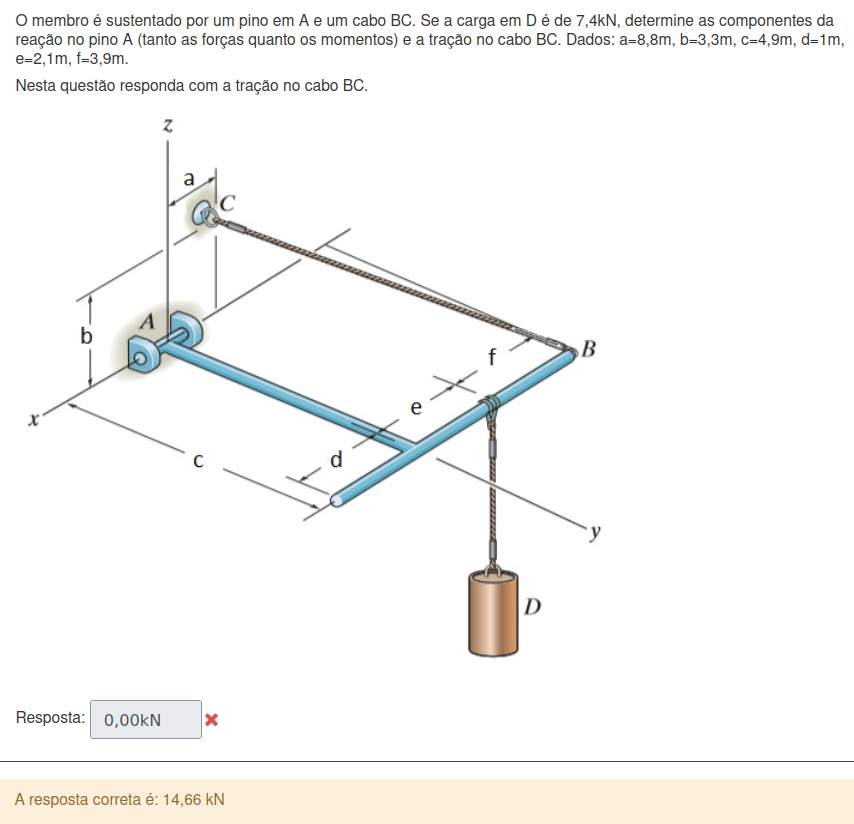

In [222]:
questao='3.4'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [223]:
%%write_and_run inputs/{questao}.py
a=8.8
b=3.3
c=4.9
d=1
e=2.1
f=3.9
P=7.4

In [224]:
%%write_and_run resolutions/{questao}.py
DX=a-(f+e)
DY=c
DZ=b
H=(DX**2+DY**2+DZ**2)**0.5
#Prova Real
aplicacao=[
    [0,0,0],
    [-e,c,0],
    [-e-f,c,0]]
aplicacao
RAx,RAy,RAz,MAy,MAz,T = sy.symbols('RAx RAy RAz MAy MAz T')

vRA =    vector(RAx,RAy,RAz)
vP  =P  *vector(0,0,-1)
vT  =T  *vector(DX/H,DY/H,DZ/H)
Forcas=[vRA,vP,vT]
#print(Forcas)

#print(icognitas)
n=len(Forcas)
vetorAplicacao=[]
for ff in range(n):
    vetorAplicacao.append(vector(*aplicacao[ff]))

#Somatorio das forcas
dir=[i,j,k]
somaF=[0,0,0]
for ff in range(n):
    for d in range(3):
        somaF[d]+=Forcas[ff].dot(dir[d])
#Somatorio dos momentos


somaM=[0,MAy,MAz]
for ff in range(n):
    for d in range(3):
        somaM[d]+=(vetorAplicacao[ff].cross(Forcas[ff])).dot(dir[d])
#Resolver equacoes
equacoes=somaF+somaM
equacoes = [i for i in equacoes if i != 0] #eliminar zeros
#print(equacoes)
icognitas=[RAx,RAy,RAz,T,MAy,MAz]
result=sy.solve(equacoes,*icognitas)
#print(result)
res=[]
for icog in range(len(icognitas)):
    res.append(result[icognitas[icog]])
RAx=res[0]
RAy=res[1]
RAz=res[2]
T=res[3]
MAy=res[4]
MAz=res[5]
resposta(res[3],'kN')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
DX,2.8
DY,4.9
DZ,3.3
H,6.54
aplicacao,"[[0, 0, 0], [-2.1, 4.9, 0], [-6.0, 4.9, 0]]"
vRA,RAx*N.i + RAy*N.j + RAz*N.k
vP,(-7.4)*N.k
vT,0.428292798879806*T*N.i + 0.74951239803966*T*N...
Forcas,"[RAx*N.i + RAy*N.j + RAz*N.k, (-7.4)*N.k, 0.42..."
n,3


A resposta final é:


14.660kN

<IPython.core.display.Math object>

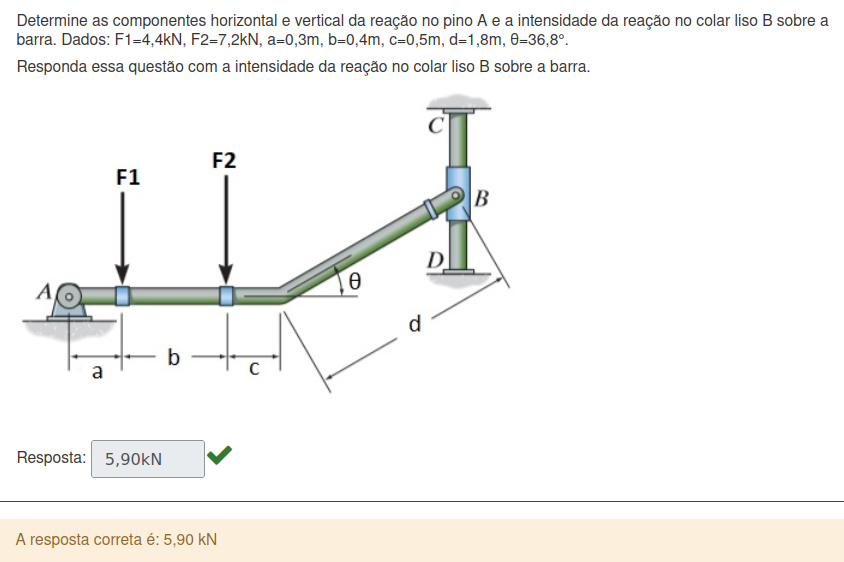

In [225]:
questao='3.5'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [226]:
%%write_and_run inputs/{questao}.py
a=0.3
b=0.4
c=0.5
d=1.8
thetad=36.8
F1=4.4
F2=7.2

In [227]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
RAx,RAy,RBx = sy.symbols('RAx RAy RBx')
#a,b,theta, r, F1, F2, F3 = sy.symbols(r'a b \theta r F_1 F_2 F_3')
aplicacao=[
    [0,0,0],
    [a,0,0],
    [a+b,0,0],
    [a+b+c+d*sy.cos(theta),d*sy.sin(theta),0]]
vRA  =vector(RAx,RAy,0)
vF1  =F1*vector(0,-1,0)
vF2  =F2*vector(0,-1,0)
vRB  =vector(RBx,0,0)

Forcas=[vRA,vF1,vF2,vRB]
icognitas=[RAx,RAy,RBx]
RAx,RAy,RBx=solveForces(Forcas,aplicacao,icognitas,True)
resposta(abs(RBx),'kN')

{RAx: 5.89848770914726, RBx: -5.89848770914726, RAy: 11.6000000000000}
Forcas
[RAx*N.i + RAy*N.j, (-4.4)*N.j, (-7.2)*N.j, RBx*N.i]
Equacoes
[RAx + RBx, RAy - 11.6, -1.07824247732805*RBx - 6.36]


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.64
aplicacao,"[[0, 0, 0], [0.3, 0, 0], [0.7, 0, 0], [2.64131..."
vRA,RAx*N.i + RAy*N.j
vF1,(-4.4)*N.j
vF2,(-7.2)*N.j
vRB,RBx*N.i
Forcas,"[RAx*N.i + RAy*N.j, (-4.4)*N.j, (-7.2)*N.j, RB..."
icognitas,"[RAx, RAy, RBx]"


A resposta final é:


5.898kN

<IPython.core.display.Math object>

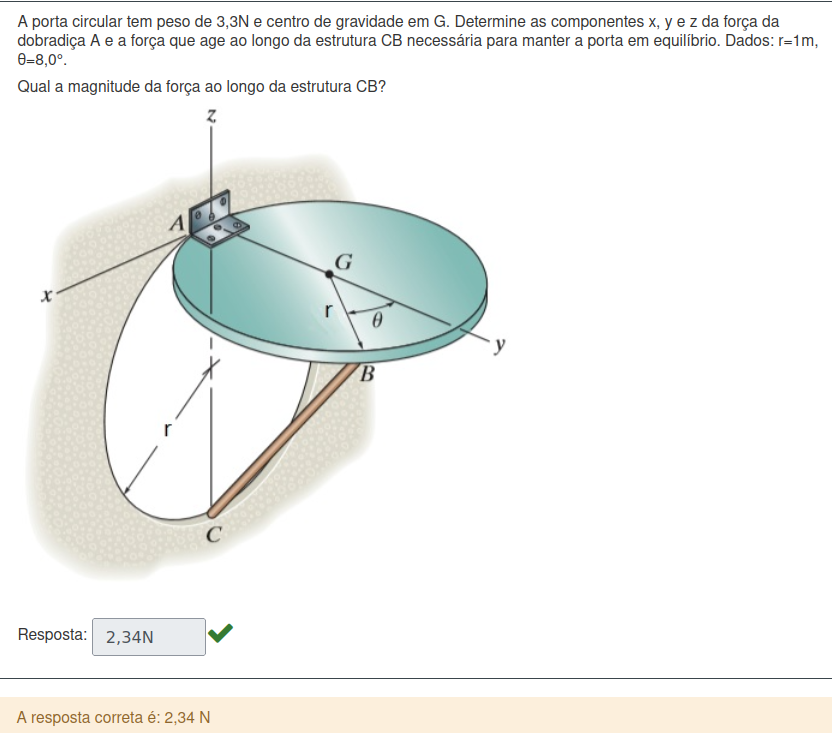

In [228]:
questao='3.6'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [229]:
%%write_and_run inputs/{questao}.py
P=3.3
r=1
thetad=8

In [230]:
%%write_and_run resolutions/{questao}.py
#Prova Real
theta=np.deg2rad(thetad)
aplicacao=[
    [0,0,0],
    [0,r,0],
    [r*sy.sin(theta),r*(1+sy.cos(theta)),0]]
aplicacao
RAx,RAy,RAz,T = sy.symbols('RAx RAy RAz T')

vRA =    vector(RAx,RAy,RAz)
vP  =P  *vector(0,0,-1)
vT  =T  *unit(vector(r*sy.sin(theta),r*(1+sy.cos(theta)),2*r))
#print(vT)
Forcas=[vRA,vP,vT]
#print(Forcas)

#print(icognitas)
n=len(Forcas)
vetorAplicacao=[]
for f in range(n):
    vetorAplicacao.append(vector(*aplicacao[f]))

#Somatorio das forcas
dir=[i,j,k]
somaF=[0,0,0]
for f in range(n):
    for d in range(3):
        somaF[d]+=Forcas[f].dot(dir[d])
#Somatorio dos momentos

MAy,MAz = sy.symbols('MAy MAz')

somaM=[0,MAy,MAz]
for f in range(n):
    for d in range(3):
        somaM[d]+=(vetorAplicacao[f].cross(Forcas[f])).dot(dir[d])
#Resolver equacoes
equacoes=somaF+somaM
equacoes = [i for i in equacoes if i != 0] #eliminar zeros
#print(equacoes)
icognitas=[RAx,RAy,RAz,T,MAy,MAz]
result=sy.solve(equacoes,*icognitas)
print(result)
res=[]
for icog in range(len(icognitas)):
    res.append(result[icognitas[icog]])
RAx=res[0]
RAy=res[1]
RAz=res[2]
T=res[3]
MAy=res[4]
MAz=res[5]
resposta(res[3],'N')


{RAx: -0.115379239706792, RAy: -1.65000000000000, RAz: 1.64193189760284, T: 2.34200815565238, MAy: 0.230758479413585, MAz: 0.0}


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.14
aplicacao,"[[0, 0, 0], [0, 1, 0], [0.139173100960065, 1.9..."
vRA,RAx*N.i + RAy*N.j + RAz*N.k
vP,(-3.3)*N.k
vT,0.0492650887779051*T*N.i + 0.704523592720105*T...
Forcas,"[RAx*N.i + RAy*N.j + RAz*N.k, (-3.3)*N.k, 0.04..."
n,3
vetorAplicacao,"[0, N.j, 0.139173100960065*N.i + 1.99026806874..."
dir,"[N.i, N.j, N.k]"
somaF,"[RAx + 0.0492650887779051*T, RAy + 0.704523592..."


A resposta final é:


2.342N

<IPython.core.display.Math object>

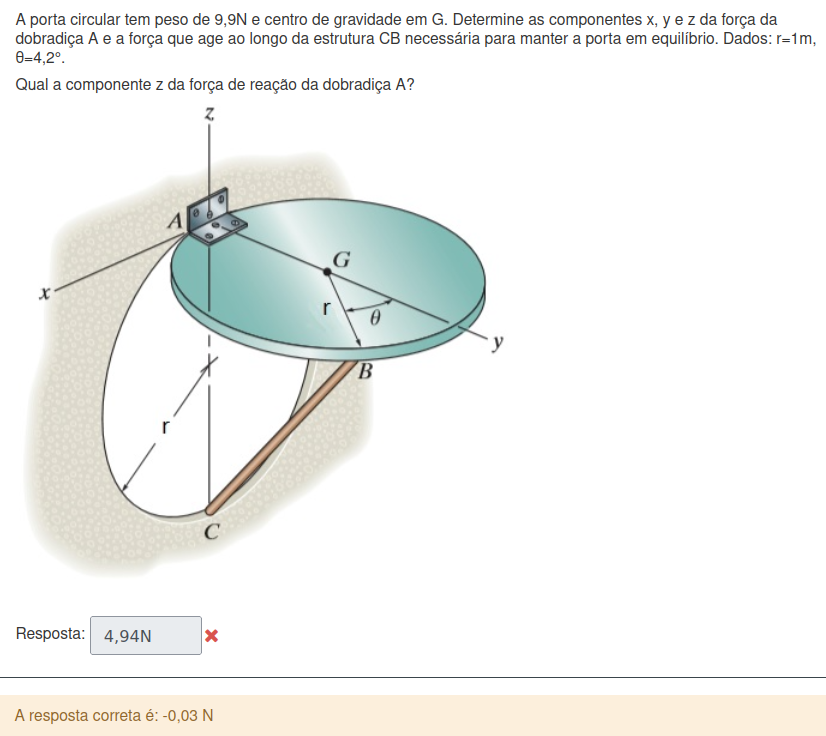

In [231]:
questao='3.7'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [232]:
%%write_and_run inputs/{questao}.py
P=9.9
r=1
thetad=4.2

In [233]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
Rx=-P*sy.sin(theta)/(2*(1+sy.cos(theta)))
Rz=P*(1-1/(1+sy.cos(theta)))
Ry=-P/2
resposta(Rz,'N')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.07
Rx,-0.181508260174212
Rz,4.94334439424011
Ry,-4.95


A resposta final é:


4.943N

<IPython.core.display.Math object>

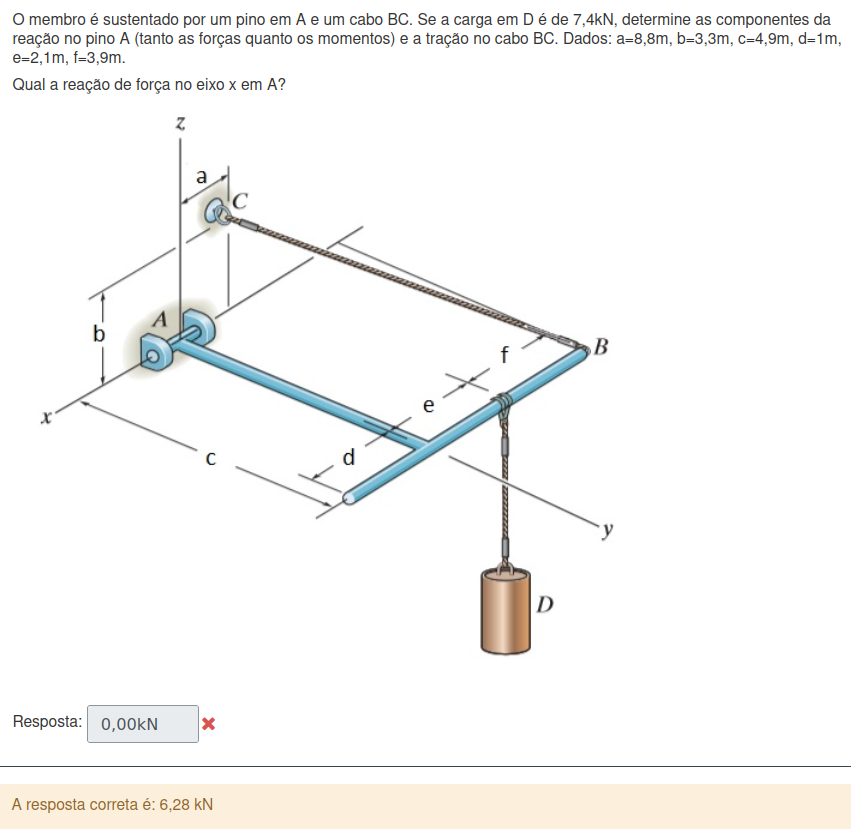

In [234]:
questao='3.8'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [235]:
%%write_and_run inputs/{questao}.py
a=8.8
b=3.3
c=4.9
d=1
e=2.1
f=3.9
P=7.4

In [236]:
%%write_and_run resolutions/{questao}.py
DX=a-(f+e)
DY=c
DZ=b
H=(DX**2+DY**2+DZ**2)**0.5
#Prova Real
aplicacao=[
    [0,0,0],
    [-e,c,0],
    [-e-f,c,0]]
aplicacao
RAx,RAy,RAz,MAy,MAz,T = sy.symbols('RAx RAy RAz MAy MAz T')

vRA =    vector(RAx,RAy,RAz)
vP  =P  *vector(0,0,-1)
vT  =T  *vector(DX/H,DY/H,DZ/H)
Forcas=[vRA,vP,vT]
#print(Forcas)

#print(icognitas)
n=len(Forcas)
vetorAplicacao=[]
for ff in range(n):
    vetorAplicacao.append(vector(*aplicacao[ff]))

#Somatorio das forcas
dir=[i,j,k]
somaF=[0,0,0]
for ff in range(n):
    for d in range(3):
        somaF[d]+=Forcas[ff].dot(dir[d])
#Somatorio dos momentos


somaM=[0,MAy,MAz]
for ff in range(n):
    for d in range(3):
        somaM[d]+=(vetorAplicacao[ff].cross(Forcas[ff])).dot(dir[d])
#Resolver equacoes
equacoes=somaF+somaM
equacoes = [i for i in equacoes if i != 0] #eliminar zeros
print(equacoes)
icognitas=[RAx,RAy,RAz,T,MAy,MAz]
result=sy.solve(equacoes,*icognitas)
#print(result)
res=[]
for icog in range(len(icognitas)):
    res.append(result[icognitas[icog]])

resposta(-res[0],'kN')


[RAx + 0.428292798879806*T, RAy + 0.74951239803966*T, RAz + 0.504773655822628*T - 7.4, 2.47339091353088*T - 36.26, MAy + 3.02864193493577*T - 15.54, MAz - 6.59570910274901*T]


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
DX,2.8
DY,4.9
DZ,3.3
H,6.54
aplicacao,"[[0, 0, 0], [-2.1, 4.9, 0], [-6.0, 4.9, 0]]"
vRA,RAx*N.i + RAy*N.j + RAz*N.k
vP,(-7.4)*N.k
vT,0.428292798879806*T*N.i + 0.74951239803966*T*N...
Forcas,"[RAx*N.i + RAy*N.j + RAz*N.k, (-7.4)*N.k, 0.42..."
n,3


A resposta final é:


6.279kN

<IPython.core.display.Math object>

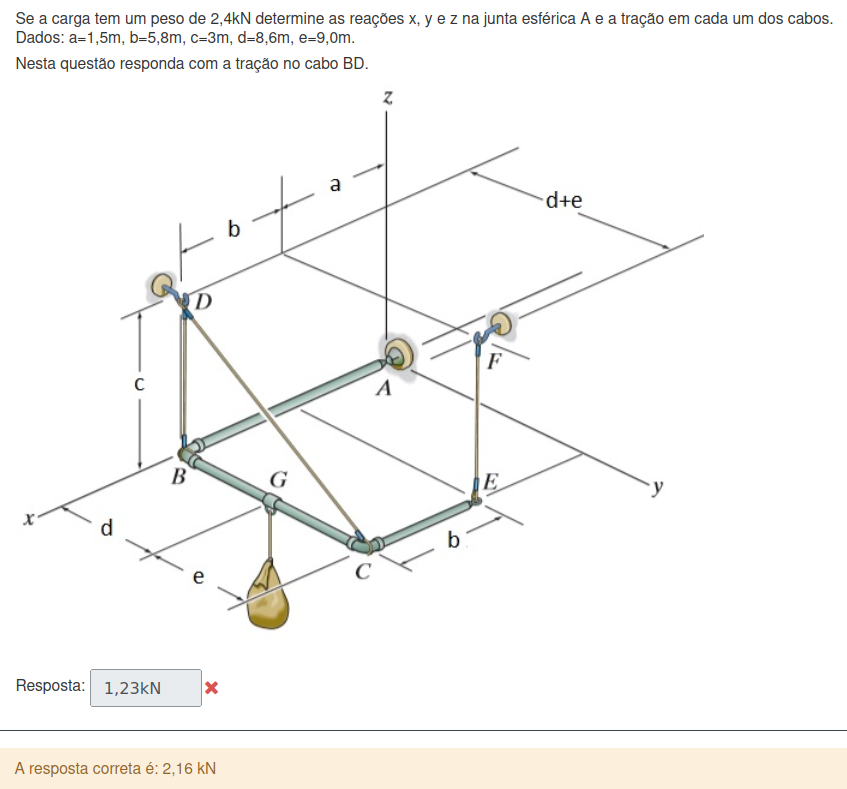

In [237]:
questao='3.9'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [238]:
%%write_and_run inputs/{questao}.py
a=1.5
b=5.
d=8.
e=9
P=2.4

In [239]:
%%write_and_run resolutions/{questao}.py
#Prova Real
aplicacao=[
    [0,0,0], #RA
    [a+b,0,0], #Tbd
    [a+b,d+e,0], #Tcd
    [a,d+e,0],
    [a+b,d,0]]
aplicacao
Tbd,Tcd,Tef,RAx,RAy,RAz = sy.symbols('Tbd Tcd Tef RAx RAy RAz')
vTbd=Tbd*vector(0,0,1)
vTef=Tef*vector(0,0,1)
vTcd=Tcd*1/(sy.sqrt((d+e)**2+c**2))*vector(-d-e,c,0)
vP  =P*vector(0,0,-1)
vRA=vector(RAx,RAy,RAz)

Forcas=[vRA,vTbd,vTcd,vTef,vP]
icognitas=[RAx,RAy,RAz,Tbd,Tcd,Tef]
res=solveForces(Forcas,aplicacao,icognitas)[3]
resposta(res,'kN')

{RAx: 0.0, RAy: 0.0, Tcd: 0.0, RAz: -0.868778280542986, Tbd: 2.13936651583710, Tef: 1.12941176470588}


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
aplicacao,"[[0, 0, 0], [6.5, 0, 0], [6.5, 17.0, 0], [1.5,..."
vTbd,Tbd*N.k
vTef,Tef*N.k
vTcd,(-0.960881462783641*Tcd)*N.i + 0.2769599510376...
vP,(-2.4)*N.k
vRA,RAx*N.i + RAy*N.j + RAz*N.k
Forcas,"[RAx*N.i + RAy*N.j + RAz*N.k, Tbd*N.k, (-0.960..."
icognitas,"[RAx, RAy, RAz, Tbd, Tcd, Tef]"
res,2.13936651583710


A resposta final é:


2.139kN

<IPython.core.display.Math object>

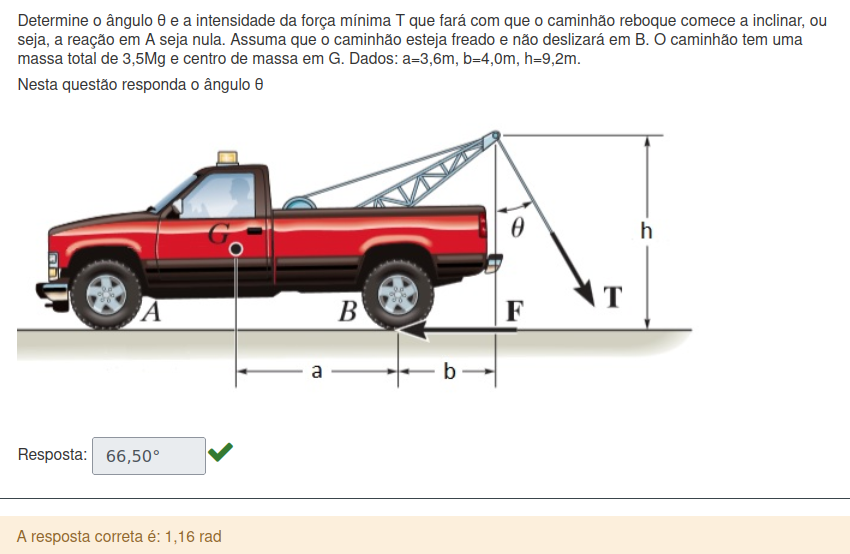

In [240]:
questao='3.10'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [241]:
%%write_and_run inputs/{questao}.py
a=3.6
b=4.0
h=9.2
m=3.5

In [242]:
%%write_and_run resolutions/{questao}.py
P=m*9.8
theta=sy.atan(h/b)
T=P*a/(sy.cos(theta)*b+sy.sin(theta)*h)
resposta(theta,'^{\circ}')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
P,34.3
theta,1.16066898625341
T,12.3086750593641


A resposta final é:


66.501^{\circ}

<IPython.core.display.Math object>

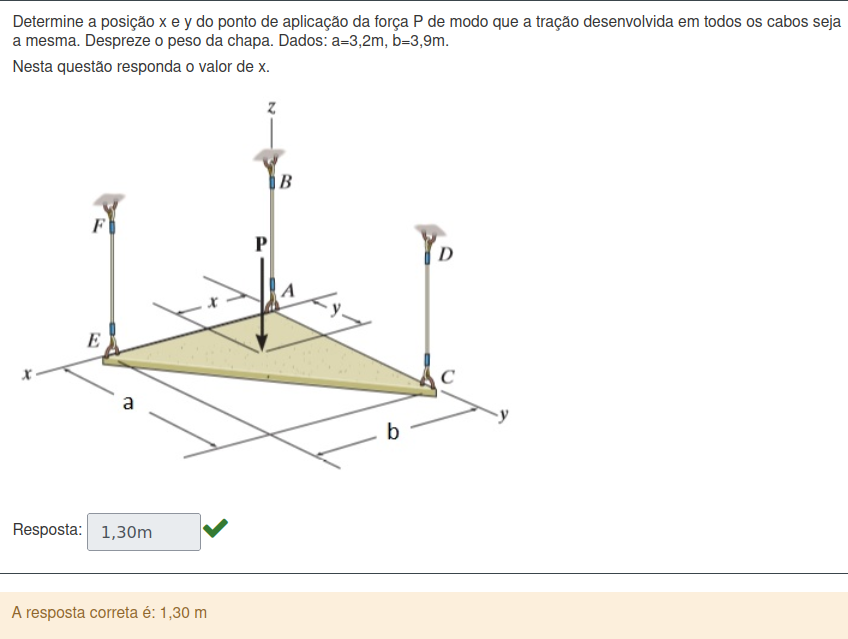

In [243]:
questao='4.1'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [244]:
%%write_and_run inputs/{questao}.py
a=3.2
b=3.9

In [245]:
%%write_and_run resolutions/{questao}.py
x=b/3
resposta(x,'m')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
x,1.3


A resposta final é:


1.300m

<IPython.core.display.Math object>

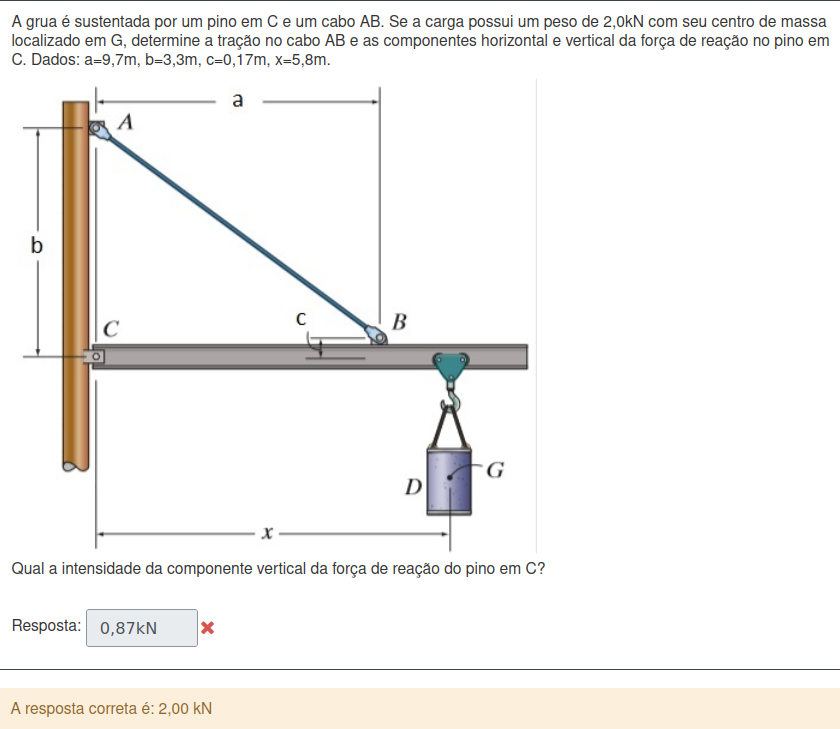

In [246]:
questao='4.2'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [247]:
%%write_and_run inputs/{questao}.py
a=9.7
b=3.3
c=0.17
x=5.8
P=2.0

In [248]:
%%write_and_run resolutions/{questao}.py
H=(a**2+(b-c)**2)**0.5
T=P*x*H/(b*a)
RCx=T*a/H
RCy=P*(1-x*(b-c)/(b*a))
resposta(RCy,'kN')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
H,10.19
T,3.69
RCx,3.52
RCy,0.87


A resposta final é:


0.866kN

<IPython.core.display.Math object>

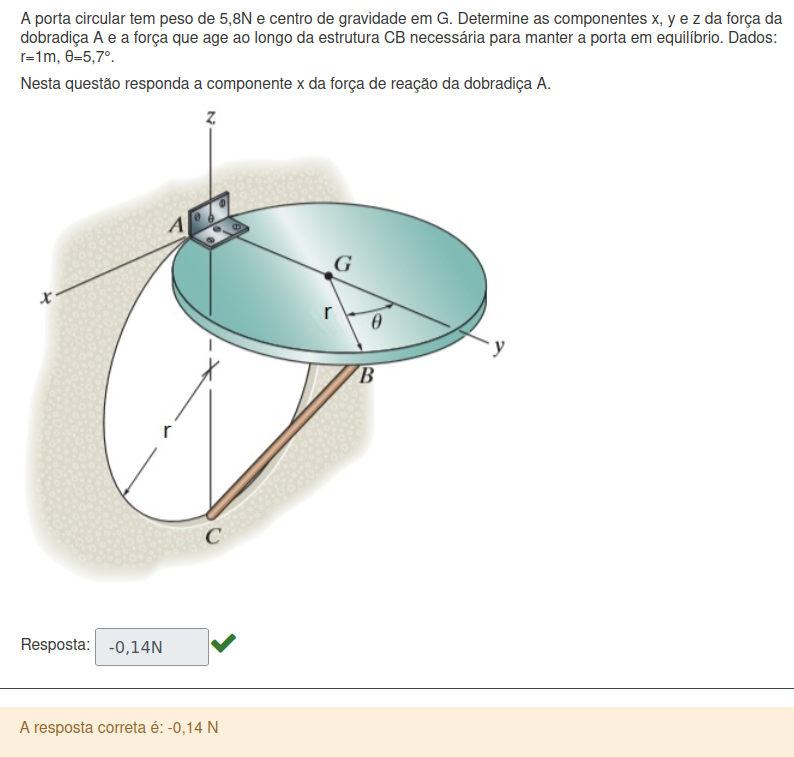

In [249]:
questao='4.3'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [250]:
%%write_and_run inputs/{questao}.py
P=5.8
r=1
thetad=5.7

In [251]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
Rx=-P*sy.sin(theta)/(2*(1+sy.cos(theta)))
Rz=-P*(1-1/(1+sy.cos(theta)))
Ry=-P/2
resposta(Rx,'N')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.1
Rx,-0.144370552175723
Rz,-2.89281280816016
Ry,-2.9


A resposta final é:


-0.144N

<IPython.core.display.Math object>

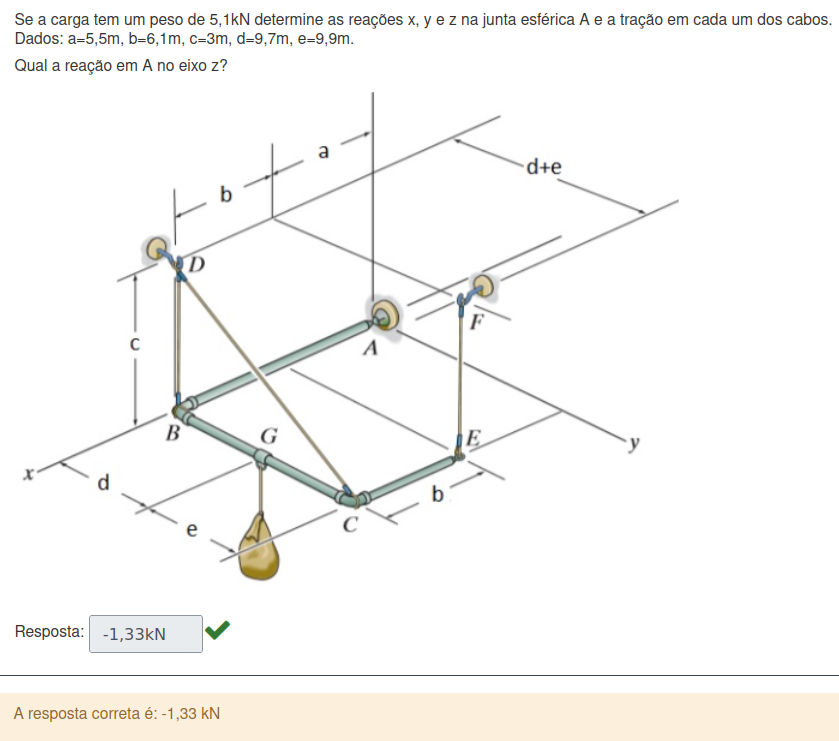

In [252]:
questao='4.4'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [253]:
%%write_and_run inputs/{questao}.py
a=5.5
b=6.1
c=3
d=9.7
e=9.9
P=5.1

In [254]:
%%write_and_run resolutions/{questao}.py
Fcd=0
FRax=0
FRay=0
Fef=P*d/(d+e)
Fbd=(P*(a+b)-Fef*a)/(a+b)
FRaz=P-Fbd-Fef
resposta(FRaz,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
Fcd,0.00
FRax,0.00
FRay,0.00
Fef,2.52
Fbd,3.90
FRaz,-1.33


A resposta final é:


-1.327kN

<IPython.core.display.Math object>

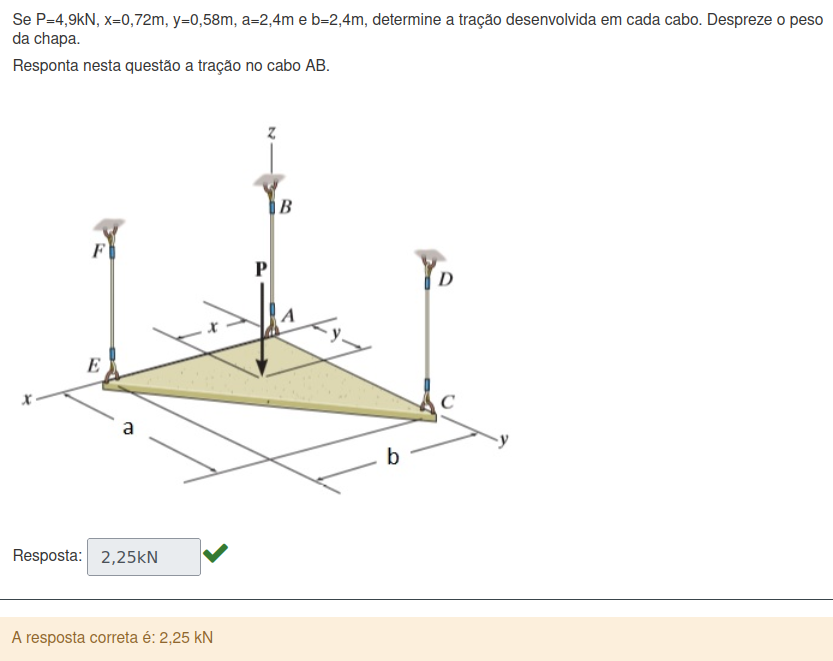

In [255]:
questao='4.5'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [256]:
%%write_and_run inputs/{questao}.py
P=4.9
x=0.72
y=0.58
a=2.4
b=2.4

In [257]:
%%write_and_run resolutions/{questao}.py
FCD=P*y/a
FEF=P*x/b
FAB=P*(1-y/a-x/b)
resposta(FAB,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
FCD,1.18
FEF,1.47
FAB,2.25


A resposta final é:


2.246kN

<IPython.core.display.Math object>

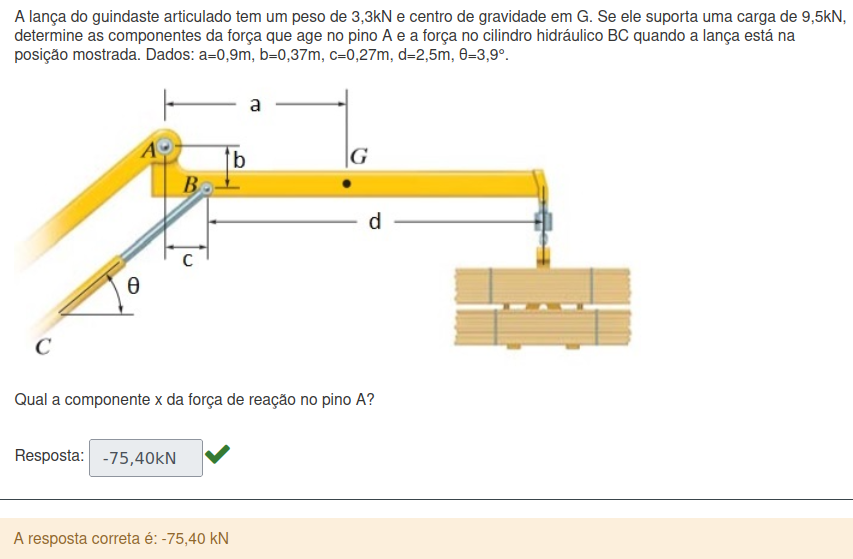

In [258]:
questao='4.6'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [259]:
%%write_and_run inputs/{questao}.py
modPL=3.3
modPC=9.5
a=0.9
b=0.37
c=0.27
d=2.5
thetad=3.9

In [260]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
RAy=(-modPL*(a-c)-modPC*d+b/sy.tan(theta)*(modPL+modPC))/(c+b/sy.tan(theta))
RAx=(RAy-modPL-modPC)/sy.tan(theta)
modT=-RAx/sy.cos(theta)
resposta(RAx,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.07
RAy,7.65989624645575
RAx,-75.3977621257920
modT,75.5727675831362


A resposta final é:


-75.398kN

<IPython.core.display.Math object>

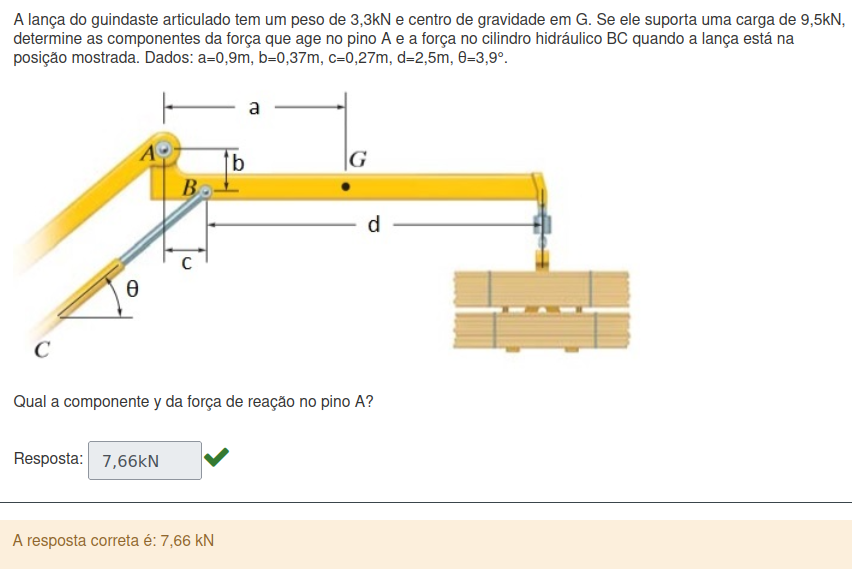

In [261]:
questao='4.7'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [262]:
%%write_and_run inputs/{questao}.py
modPL=3.3
modPC=9.5
a=0.9
b=0.37
c=0.27
d=2.5
thetad=3.9

In [263]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
RAy=(-modPL*(a-c)-modPC*d+b/sy.tan(theta)*(modPL+modPC))/(c+b/sy.tan(theta))
RAx=(RAy-modPL-modPC)/sy.tan(theta)
modT=-RAx/sy.cos(theta)
resposta(RAy,'kN')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.07
RAy,7.65989624645575
RAx,-75.3977621257920
modT,75.5727675831362


A resposta final é:


7.660kN

<IPython.core.display.Math object>

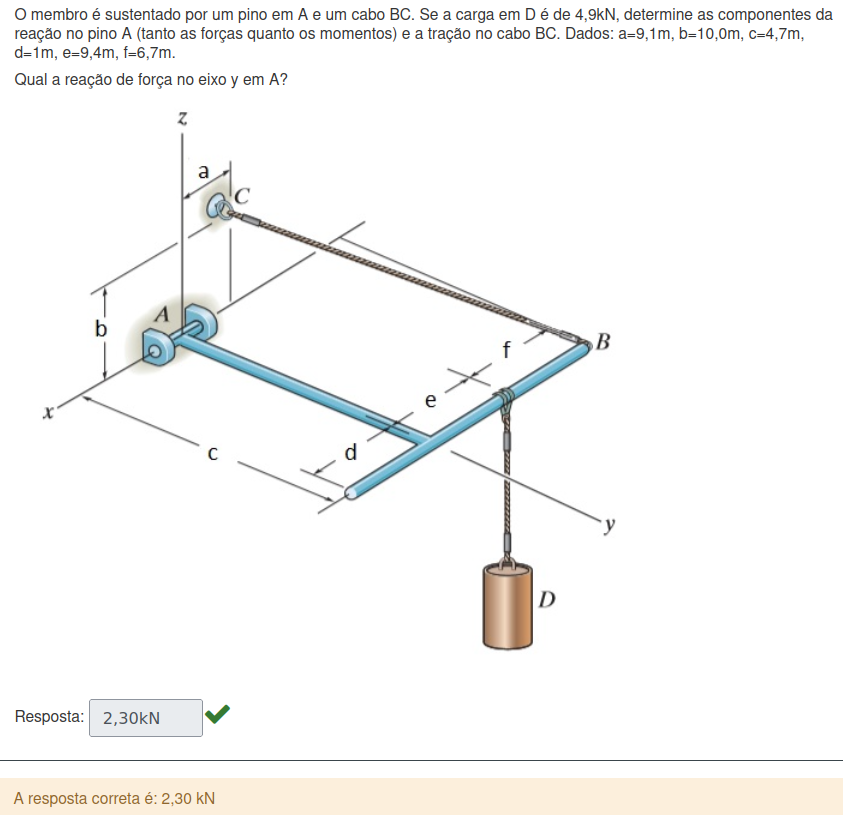

In [264]:
questao='4.8'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [265]:
%%write_and_run inputs/{questao}.py
a=9.1
b=10
c=4.7
d=1
e=9.4
f=6.7
P=4.9

In [266]:
DX=abs(a-f-e)
DY=c
DZ=b
L=sy.sqrt(DX**2+DY**2+DZ**2)
FCB=P*L/DZ
FCBx=FCB*DX/L
FRAx=-FCBx
FCBy=FCB*DY/L
FRAy=FCBy
#MAz=FBCx*c-FBCy*(f+e)
resposta(FRAy,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
DX,7.0
DY,4.7
DZ,10
L,13.0801376139550
FCB,6.40926743083794
FCBx,3.43000000000000
FRAx,-3.43000000000000
FCBy,2.30300000000000
FRAy,2.30300000000000


A resposta final é:


2.303kN

<IPython.core.display.Math object>

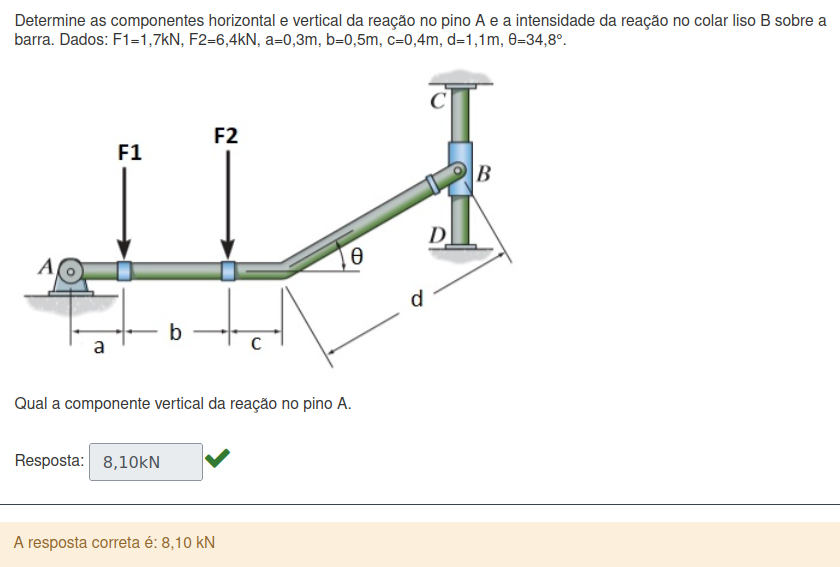

In [267]:
questao='4.9'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [268]:
%%write_and_run inputs/{questao}.py
a=0.3
b=0.5
c=0.4
d=1.1
thetad=34.8
F1
F2=6.4

In [269]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
RAx,RAy,RBx = sy.symbols('RAx RAy RBx')
#a,b,theta, r, F1, F2, F3 = sy.symbols(r'a b \theta r F_1 F_2 F_3')
aplicacao=[
    [0,0,0],
    [a,0,0],
    [a+b,0,0],
    [a+b+c+d*sy.cos(theta),d*sy.sin(theta),0]]
vRA  =vector(RAx,RAy,0)
vF1  =F1*vector(0,-1,0)
vF2  =F2*vector(0,-1,0)
vRB  =vector(RBx,0,0)

Forcas=[vRA,vF1,vF2,vRB]
icognitas=[RAx,RAy,RBx]
res=solveForces(Forcas,aplicacao,icognitas,True)[1]
resposta(abs(res),'kN')

{RAx: 10.2582902984052, RBx: -10.2582902984052, RAy: 10.8000000000000}
Forcas
[RAx*N.i + RAy*N.j, (-4.4)*N.j, (-6.4)*N.j, RBx*N.i]
Equacoes
[RAx + RBx, RAy - 10.8, -0.627784924452875*RBx - 6.44]


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.61
aplicacao,"[[0, 0, 0], [0.3, 0, 0], [0.8, 0, 0], [2.10326..."
vRA,RAx*N.i + RAy*N.j
vF1,(-4.4)*N.j
vF2,(-6.4)*N.j
vRB,RBx*N.i
Forcas,"[RAx*N.i + RAy*N.j, (-4.4)*N.j, (-6.4)*N.j, RB..."
icognitas,"[RAx, RAy, RBx]"
res,10.8000000000000


A resposta final é:


10.800kN

<IPython.core.display.Math object>

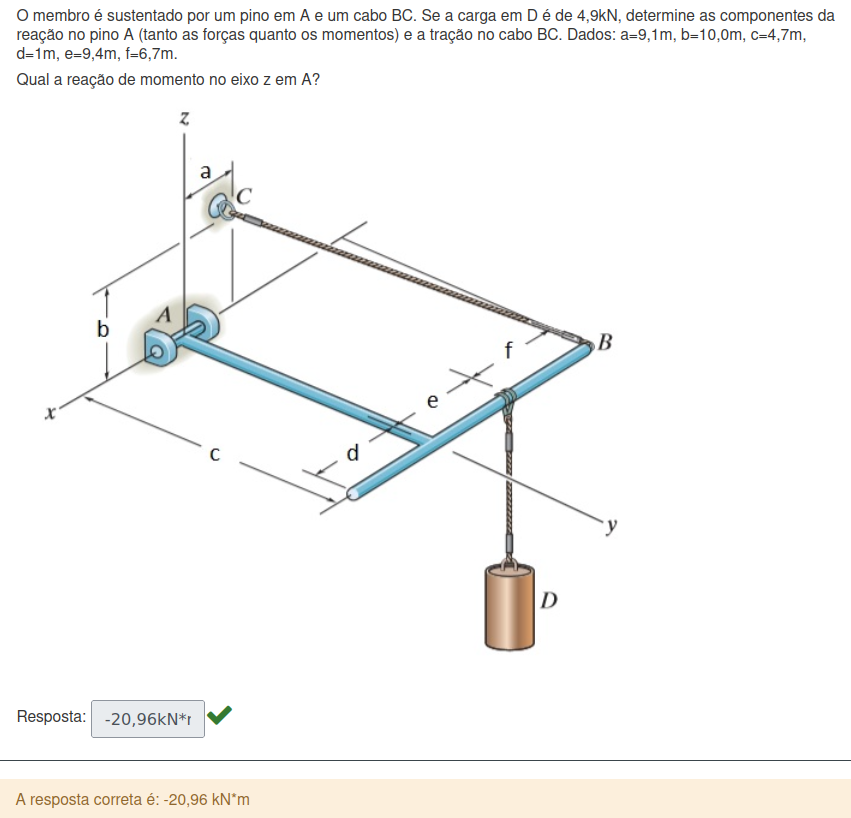

In [270]:
questao='4.10'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [271]:
%%write_and_run inputs/{questao}.py
a=9.1
b=10
c=4.7
d=1
e=9.4
f=6.7
P=4.9

In [272]:
%%write_and_run resolutions/{questao}.py
DX=abs(a-f-e)
DY=c
DZ=b
L=sy.sqrt(DX**2+DY**2+DZ**2)
FCB=P*L/DZ
FCBx=FCB*DX/L
FRAx=-FCBx
FCBy=FCB*DY/L
FRAy=FCBy
FCBx=FCB*DX/L
MAz=FCBx*c-FCBy*(f+e)
resposta(MAz,'kN*m')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
DX,7.0
DY,4.7
DZ,10
L,13.0801376139550
FCB,6.40926743083794
FCBx,3.43000000000000
FRAx,-3.43000000000000
FCBy,2.30300000000000
FRAy,2.30300000000000
MAz,-20.9573000000000


A resposta final é:


-20.957kN*m

<IPython.core.display.Math object>

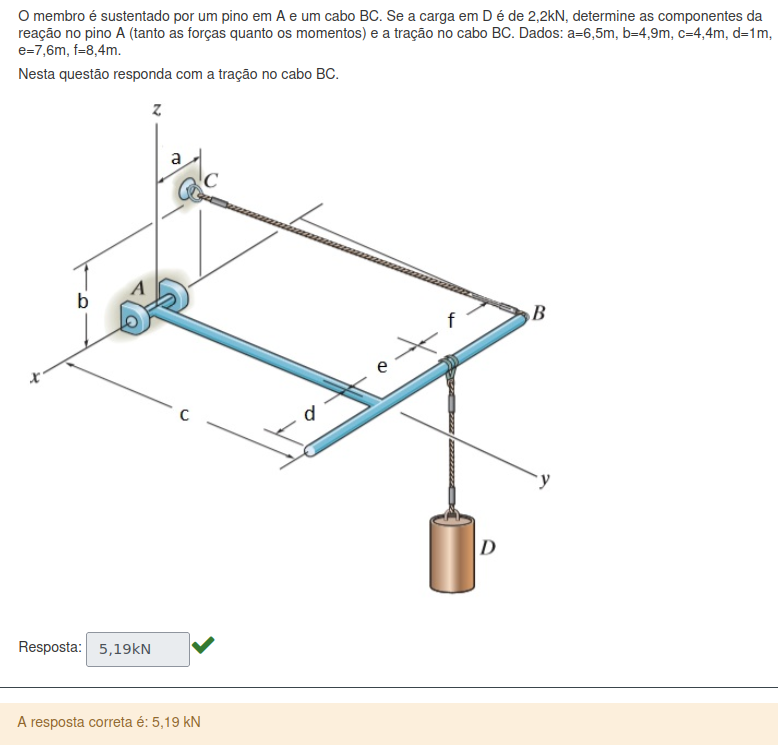

In [273]:
questao='5.1'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [274]:
%%write_and_run inputs/{questao}.py
a=6.5
b=4.9
c=4.4
d=1
e=7.6
f=8.4
P=2.2

In [275]:
%%write_and_run resolutions/{questao}.py
DX=abs(a-f-e)
DY=c
DZ=b
L=sy.sqrt(DX**2+DY**2+DZ**2)
FCB=P*L/DZ
FCBx=FCB*DX/L
FRAx=-FCBx
FCBy=FCB*DY/L
FRAy=FCBy
FCBx=FCB*DX/L
MAz=FCBx*c-FCBy*(f+e)
resposta(FCB,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
DX,9.5
DY,4.4
DZ,4.9
L,11.5594117497388
FCB,5.18993996927049
FCBx,4.26530612244898
FRAx,-4.26530612244898
FCBy,1.97551020408163
FRAy,1.97551020408163
MAz,-12.8408163265306


A resposta final é:


5.190kN

<IPython.core.display.Math object>

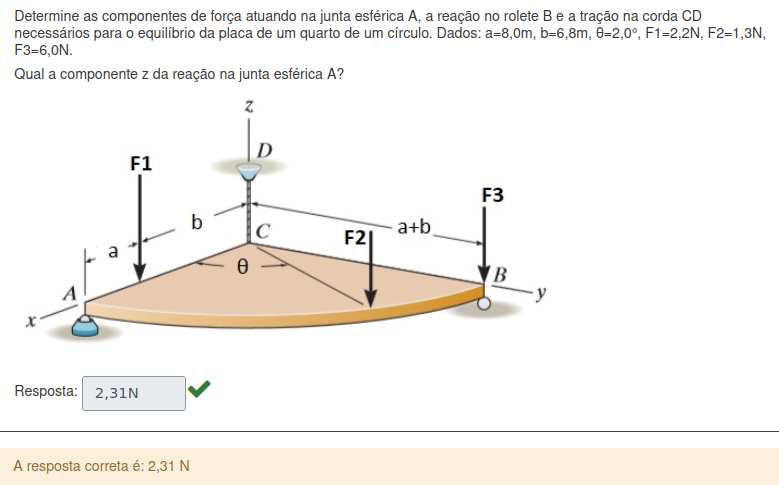

In [276]:
questao='5.2'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [277]:
%%write_and_run inputs/{questao}.py
a=8
b=6.8
thetad=2
F1=2.2
F2=1.3
F3=6

In [278]:
%%write_and_run resolutions/{questao}.py
#Prova Real
r=a+b
theta=np.deg2rad(thetad)
T,RA,RB = sy.symbols('T RA RB')
#a,b,theta, r, F1, F2, F3 = sy.symbols(r'a b \theta r F_1 F_2 F_3')
aplicacao=[
    [0,0,0],
    [b,0,0],
    [r*sy.cos(theta),r*sy.sin(theta),0],
    [0,r,0],
    [r,0,0],
    [0,r,0]]
vT   =T *vector(0,0,1)
vF1  =F1*vector(0,0,-1)
vF2  =F2*vector(0,0,-1)
vF3  =F3*vector(0,0,-1)
vRA  =RA*vector(0,0,1)
vRB  =RB*vector(0,0,1)

Forcas=[vT,vF1,vF2,vF3,vRA,vRB]
icognitas=[RA,RB,T]
RA=solveForces(Forcas,aplicacao,icognitas)[0]
resposta(RA,'N')

{RA: 2.31001888593563, RB: 6.04536934571325, T: 1.14461176835111}


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
r,14.8
theta,0.03
aplicacao,"[[0, 0, 0], [6.8, 0, 0], [14.7909842398826, 0...."
vT,T*N.k
vF1,(-2.2)*N.k
vF2,(-1.3)*N.k
vF3,(-6)*N.k
vRA,RA*N.k
vRB,RB*N.k
Forcas,"[T*N.k, (-2.2)*N.k, (-1.3)*N.k, (-6)*N.k, RA*N..."


A resposta final é:


2.310N

<IPython.core.display.Math object>

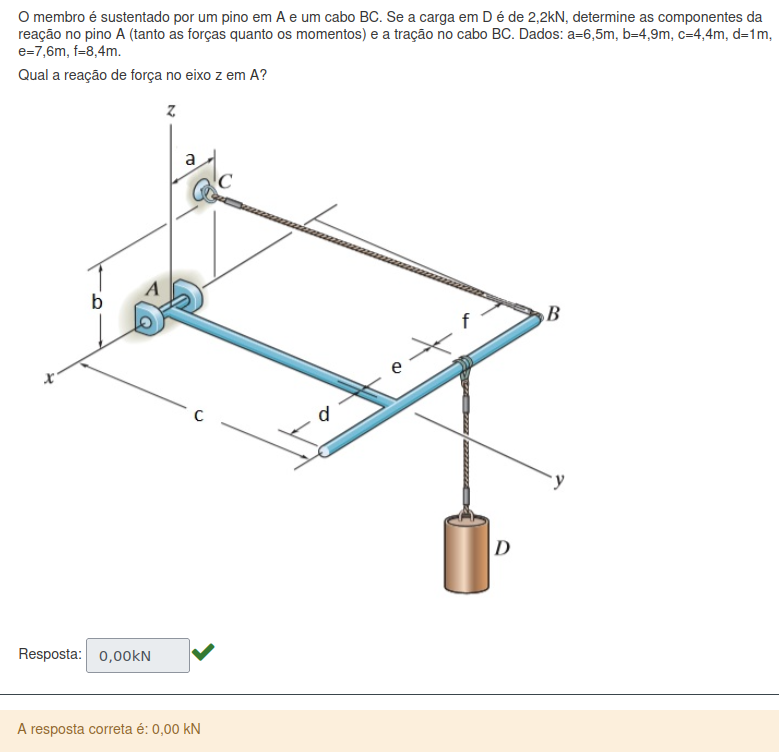

In [279]:
questao='5.3'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [280]:
%%write_and_run inputs/{questao}.py
a=6.5
b=4.9
c=4.4
d=1
e=7.6
f=8.4
P=2.2

In [281]:
%%write_and_run resolutions/{questao}.py
DX=abs(a-f-e)
DY=c
DZ=b
L=sy.sqrt(DX**2+DY**2+DZ**2)
FCB=P*L/DZ
FCBx=FCB*DX/L
FRAx=-FCBx
FCBy=FCB*DY/L
FRAy=FCBy
FCBx=FCB*DX/L
FRAz=0
MAz=FCBx*c-FCBy*(f+e)
resposta(FRAz,'kN')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
DX,9.5
DY,4.4
DZ,4.9
L,11.5594117497388
FCB,5.18993996927049
FCBx,4.26530612244898
FRAx,-4.26530612244898
FCBy,1.97551020408163
FRAy,1.97551020408163
FRAz,0


A resposta final é:


0.000kN

<IPython.core.display.Math object>

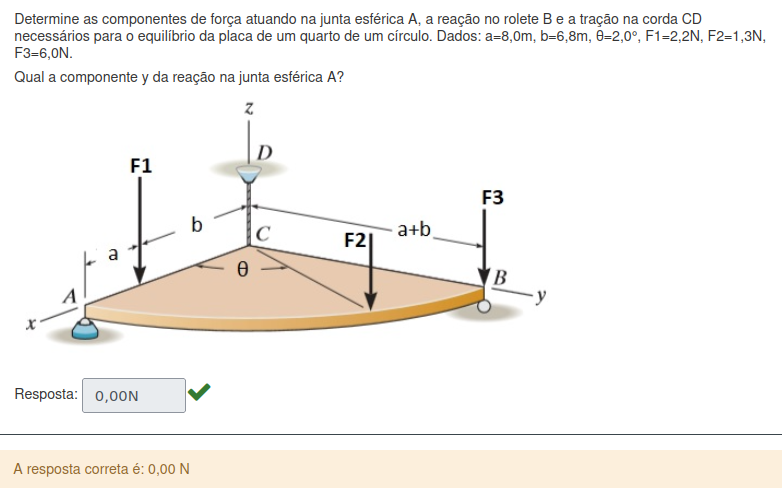

In [282]:
questao='5.4'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [283]:
%%write_and_run inputs/{questao}.py
a=8
b=6.8
thetad=2
F1=2.2
F2=1.3
F3=6

In [284]:
%%write_and_run resolutions/{questao}.py
resposta(0,'N')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0


A resposta final é:


0.000N

<IPython.core.display.Math object>

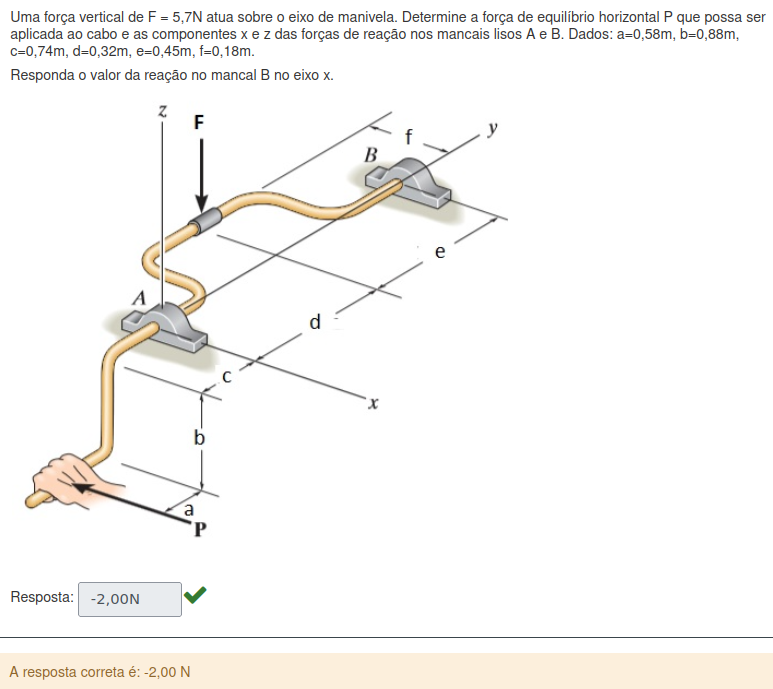

In [285]:
questao='5.5'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [286]:
%%write_and_run inputs/{questao}.py
modF=5.7
a=0.58
b=0.88
c=0.74
d=0.32
e=0.45
f=0.18

In [287]:
%%write_and_run resolutions/{questao}.py
modP=modF*f/b
modRAx=modP*(d+e+a+c)/(d+e)
modRBx=modP-modRAx
resposta(modRBx,'N')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
modP,1.17
modRAx,3.16
modRBx,-2.00


A resposta final é:


-1.999N

<IPython.core.display.Math object>

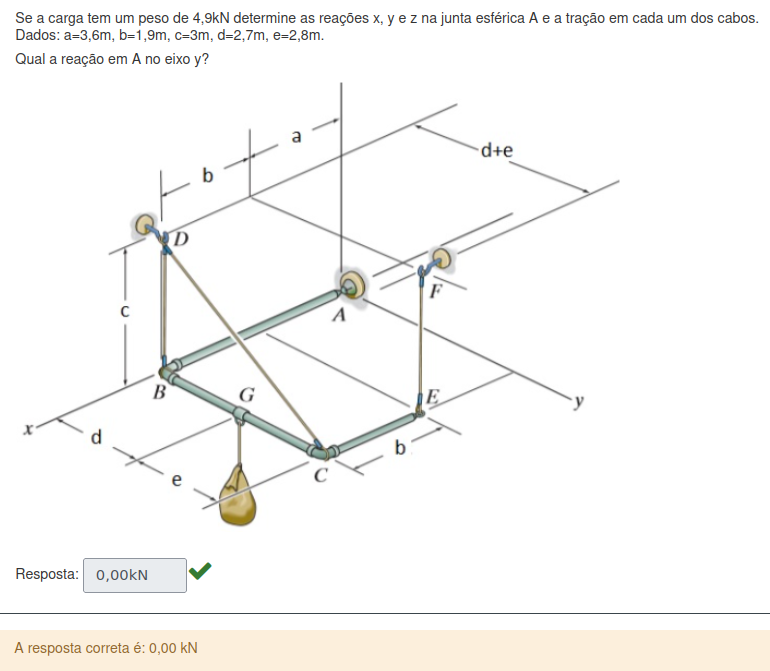

In [288]:
questao='5.6'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [289]:
%%write_and_run inputs/{questao}.py
a=3.6
b=1.9
c=3
d=2.7
e=2.8
P=4.9

In [290]:
%%write_and_run resolutions/{questao}.py
Fcd=0
FRax=0
FRay=0
Fef=P*d/(d+e)
Fbd=(P*(a+b)-Fef*a)/(a+b)
FRaz=P-Fbd-Fef
resposta(FRay,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
Fcd,0.00
FRax,0.00
FRay,0.00
Fef,2.41
Fbd,3.33
FRaz,-0.83


A resposta final é:


0.000kN

<IPython.core.display.Math object>

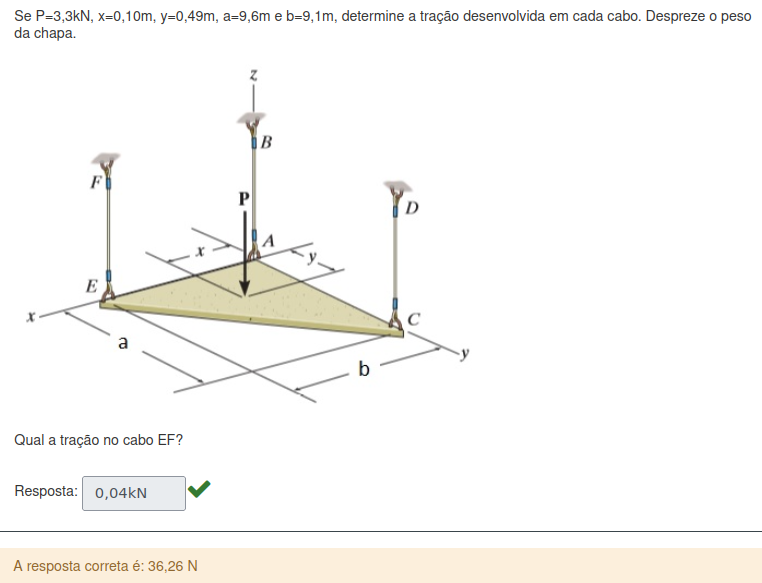

In [291]:
questao='5.7'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [292]:
%%write_and_run inputs/{questao}.py
P=3.3
x=0.1
y=0.49
a=9.6
b=9.1

In [293]:
%%write_and_run resolutions/{questao}.py
FCD=P*y/a
FEF=P*x/b
FAB=P*(1-y/a-x/b)
resposta(FEF,'kN')


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
FCD,0.17
FEF,0.04
FAB,3.10


A resposta final é:


0.036kN

<IPython.core.display.Math object>

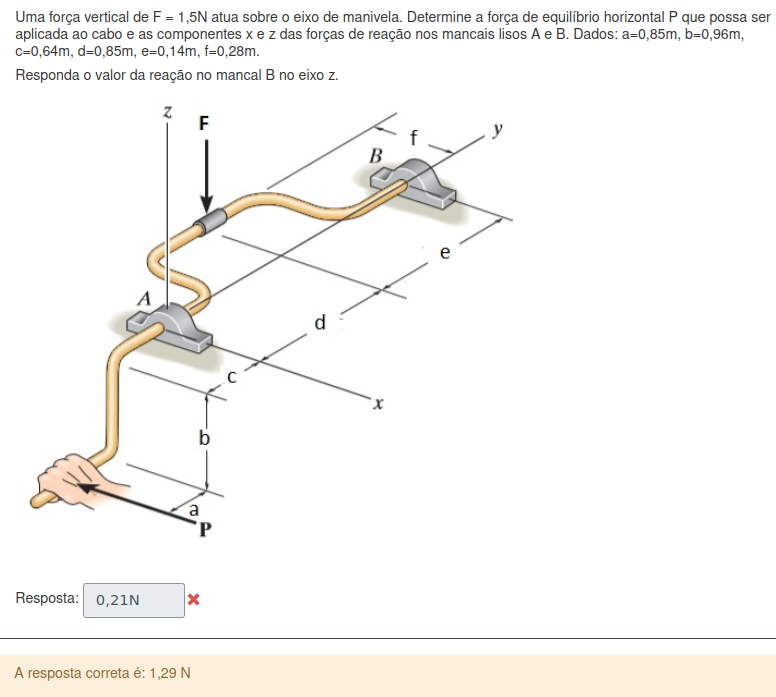

In [294]:
questao='5.8'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [295]:
%%write_and_run inputs/{questao}.py
modF=1.5
a=0.85
b=0.96
c=0.64
d=0.85
e=0.14
f=0.28

In [296]:
%%write_and_run resolutions/{questao}.py
modP=modF*f/b
modRAx=modP*(d+e+a+c)/(d+e)
modRBx=modP-modRAx
modRBz=modF*d/(d+e)
resposta(modRBz,'N')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
modP,0.44
modRAx,1.10
modRBx,-0.66
modRBz,1.29


A resposta final é:


1.288N

<IPython.core.display.Math object>

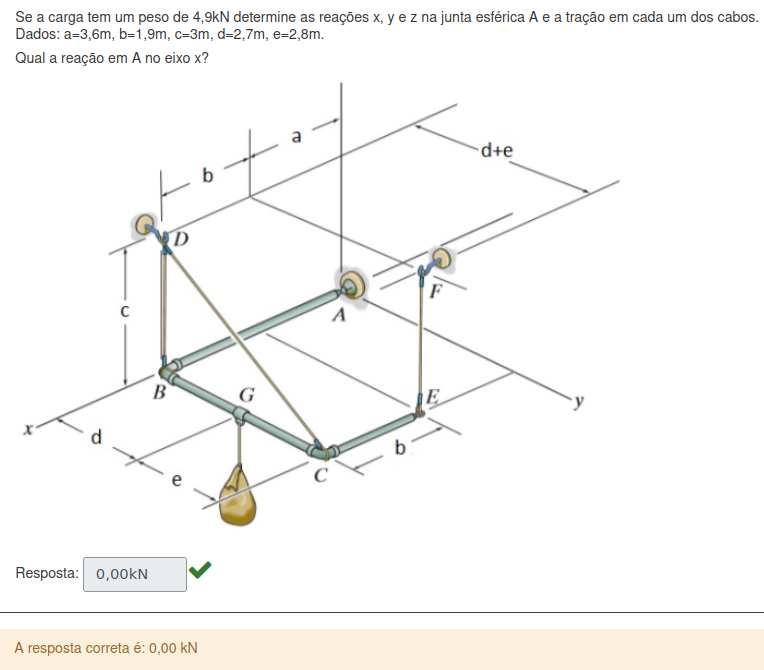

In [297]:
questao='5.9'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [298]:
%%write_and_run inputs/{questao}.py
a=3.6
b=1.9
c=3
d=2.7
e=2.8
P=4.9

In [299]:
%%write_and_run resolutions/{questao}.py
Fcd=0
FRax=0
FRay=0
Fef=P*d/(d+e)
Fbd=(P*(a+b)-Fef*a)/(a+b)
FRaz=P-Fbd-Fef
resposta(FRax,'kN')

/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
Fcd,0.00
FRax,0.00
FRay,0.00
Fef,2.41
Fbd,3.33
FRaz,-0.83


A resposta final é:


0.000kN

<IPython.core.display.Math object>

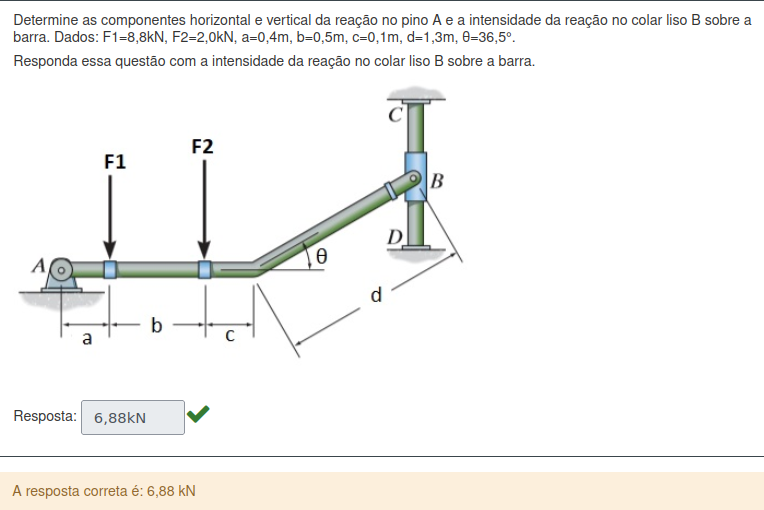

In [300]:
questao='5.10'
display(Math(r'\Large{'+questao+')}'))
Image(filename='images/'+questao+'.png') 

In [301]:
%%write_and_run inputs/{questao}.py
a=0.4
b=0.5
c=0.1
d=1.3
thetad=36.5
F1=8.8
F2=2.0

In [302]:
%%write_and_run resolutions/{questao}.py
theta=np.deg2rad(thetad)
RAx,RAy,RBx = sy.symbols('RAx RAy RBx')
#a,b,theta, r, F1, F2, F3 = sy.symbols(r'a b \theta r F_1 F_2 F_3')
aplicacao=[
    [0,0,0],
    [a,0,0],
    [a+b,0,0],
    [a+b+c+d*sy.cos(theta),d*sy.sin(theta),0]]
vRA  =vector(RAx,RAy,0)
vF1  =F1*vector(0,-1,0)
vF2  =F2*vector(0,-1,0)
vRB  =vector(RBx,0,0)

Forcas=[vRA,vF1,vF2,vRB]
icognitas=[RAx,RAy,RBx]
res=solveForces(Forcas,aplicacao,icognitas,True)[-1]
resposta(abs(res),'kN')


{RAx: 6.87987713896783, RBx: -6.87987713896783, RAy: 10.8000000000000}
Forcas
[RAx*N.i + RAy*N.j, (-8.8)*N.j, (-2.0)*N.j, RBx*N.i]
Equacoes
[RAx + RBx, RAy - 10.8, -0.773269622776744*RBx - 5.32]


/tmp/ipykernel_21939/3621424017.py:83: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  ipy.magic("history {0}".format(ipy.execution_count - offset))


,0
theta,0.64
aplicacao,"[[0, 0, 0], [0.4, 0, 0], [0.9, 0, 0], [2.04501..."
vRA,RAx*N.i + RAy*N.j
vF1,(-8.8)*N.j
vF2,(-2.0)*N.j
vRB,RBx*N.i
Forcas,"[RAx*N.i + RAy*N.j, (-8.8)*N.j, (-2.0)*N.j, RB..."
icognitas,"[RAx, RAy, RBx]"
res,-6.87987713896783


A resposta final é:


6.880kN